In [2]:
import pandas as pd
import numpy as np
import statsmodels.api as sm

In [7]:
df = pd.read_csv("D:\Script\LMdictionaryregressiondata.csv",low_memory=False)

In [ ]:
wrds_compustat = pd.read_csv("new_wrds_compustat0529.csv")

In [144]:
# 创建'next_quarter_eps'列
wrds_compustat['next_quarter_eps'] = wrds_compustat.groupby('gvkey')['epspxq'].shift(-1)

# 填充缺失值
wrds_compustat['next_quarter_eps'] = wrds_compustat.groupby('gvkey')['next_quarter_eps'].apply(lambda x: x.fillna(method='bfill'))


In [143]:
# 创建'next_quarter_eps'列
wrds_compustat['previous_niq'] = wrds_compustat.groupby('gvkey')['niq'].shift(1)

In [145]:

df_regression = pd.merge(df, wrds_compustat, on=['cik',  'datadate', 'mkvaltq', 'prccq','cshtrq'], how='left')
# 批量处理列名中的 _y
df_regression.columns = [col.replace('_y', '') for col in df_regression.columns]
df_regression

,title,url,date,GICS Sector,GICS Sub-Industry,CIK,Founded,Presentation,QandA,CompanyParticipants,...,niq,oancfy,exchg,costat,dvpspq,sic,begin_of_quarter_assets,prev_eps,previous_niq,next_quarter_eps
0,"American Airlines (AAL) CEO, Doug Parker on Q1...",https://seekingalpha.com/article/4341573-ameri...,2020-04-30,Industrials,Passenger Airlines,6201,1934,Operator\nGood morning and welcome to the Amer...,Operator\n[Operator instructions]\nYour first ...,"['Doug Parker', 'Robert Isom', 'Derek Kerr', '...",...,-2241.0,-168.0,14.0,A,0.10,4512,59995.0,0.95,414.0,-4.82
1,American Airlines Group Inc. (AAL) CEO Doug Pa...,https://seekingalpha.com/article/4360357-ameri...,2020-07-23,Industrials,Passenger Airlines,6201,1934,Operator\nGood morning and welcome to the Amer...,Operator\nThank you. [Operator instructions]. ...,"['Doug Parker', 'Robert Isom', 'Derek Kerr', '...",...,-2067.0,-1076.0,14.0,A,0.00,4512,58580.0,-5.26,-2241.0,-4.71
2,American Airlines Group Inc. (AAL) CEO Doug Pa...,https://seekingalpha.com/article/4380763-ameri...,2020-10-22,Industrials,Passenger Airlines,6201,1934,Operator\nGood morning. And welcome to the Ame...,Operator\n[Operator Instructions] Our first qu...,"['Dan Cravens', 'Doug Parker', 'Robert Isom', ...",...,-2399.0,-3680.0,14.0,A,0.00,4512,64544.0,-4.82,-2067.0,-3.81
3,American Airlines Group's (AAL) CEO Doug Parke...,https://seekingalpha.com/article/4401834-ameri...,2021-01-28,Industrials,Passenger Airlines,6201,1934,"Operator\nGood morning, and welcome to the Ame...",Operator\n[Operator Instructions] And our firs...,"['Dan Cravens', 'Doug Parker', 'Robert Isom', ...",...,-2178.0,-6543.0,14.0,A,0.00,4512,62773.0,-4.71,-2399.0,-1.97
4,"American Airlines Group, Inc. (AAL) CEO Doug P...",https://seekingalpha.com/article/4420728-ameri...,2021-04-22,Industrials,Passenger Airlines,6201,1934,"Operator\nGood morning, and welcome to the Ame...",Operator\n[Operator Instructions]. Your first ...,"['Daniel Cravens', 'Doug Parker', 'Robert Isom...",...,-1250.0,174.0,14.0,A,0.00,4512,62008.0,-3.81,-2178.0,0.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9389,Allegion plc (ALLE) Q3 2022 Earnings Call Tran...,https://seekingalpha.com/article/4549821-alleg...,2022-10-27,Industrials,Building Products,1579241,1908,"Operator\nGood morning, and welcome to the All...",Operator\n[Operator Instructions] The first qu...,"['Tom Martineau', 'John Stone', 'Mike Wagnes']",...,114.6,267.1,11.0,A,0.41,3420,3653.7,1.31,115.1,1.54
9390,Allegion plc (ALLE) Q4 2022 Earnings Call Tran...,https://seekingalpha.com/article/4580712-alleg...,2023-02-22,Industrials,Building Products,1579241,1908,"Operator\nGood day, and welcome to the Allegio...",Operator\nWe will now begin our question-and-a...,"['Tom Martineau', 'John Stone', 'Mike Wagnes']",...,135.3,459.5,11.0,A,0.41,3420,3943.3,1.30,114.6,1.40
9391,Allegion plc (ALLE) Q1 2023 Earnings Call Tran...,https://seekingalpha.com/article/4596733-alleg...,2023-04-26,Industrials,Building Products,1579241,1908,Operator\nGood morning and welcome to the Alle...,Operator\n[Operator Instructions] The first qu...,"['Tom Martineau', 'John Stone', 'Mike Wagnes']",...,123.5,69.0,11.0,A,0.45,3420,3991.2,1.54,135.3,1.62
9392,Allegion plc (ALLE) Q2 2023 Earnings Call Tran...,https://seekingalpha.com/article/4620029-alleg...,2023-07-26,Industrials,Building Products,1579241,1908,"Operator\nGood morning, and welcome to the All...",Operator\nWe will now begin the question-and-a...,"['Jobi Coyle', 'John Stone', 'Mike Wagnes']",...,142.0,230.1,11.0,A,0.45,3420,4124.4,1.40,123.5,1.78


In [146]:
df_regression = df_regression[df_regression['quarter_transformed'] >= '2014Q1']


# 确保 'quarter_transformed' 列的格式是正确的
all_quarters = [f"{year}Q{qtr}" for year in range(2014, 2025) for qtr in range(1, 5) if not (year == 2024 and qtr > 3)]

# 确保 'quarter_transformed' 列是分类数据并按顺序排序
df_regression['quarter_transformed'] = pd.Categorical(df_regression['quarter_transformed'], 
                                                      categories=all_quarters,
                                                      ordered=True)

# 排序数据
df_regression.sort_values(by=['gvkey', 'quarter_transformed'], inplace=True)

# 设置索引为 gvkey 和 quarter_transformed
df_regression.set_index(['gvkey', 'quarter_transformed'], inplace=True)

# 检查并删除重复的索引组合（保留第一个）
df_regression = df_regression[~df_regression.index.duplicated(keep='first')]

# 为每个公司插入所有可能的季度
multi_index = pd.MultiIndex.from_product([df_regression.index.levels[0], all_quarters], names=['gvkey', 'quarter_transformed'])
df_regression = df_regression.reindex(multi_index, fill_value=np.nan)

# 重设索引以便后续操作
df_regression.reset_index(inplace=True)

# 填充每个季度缺失的 gvkey 值
df_regression['gvkey'] = df_regression['gvkey'].fillna(method='ffill')

# 选择填充策略来填充其他列的 NaN 值
# 前向填充
df_regression.fillna(method='ffill', inplace=True)
# 后向填充（可选，如果前向填充后仍有 NaN）
df_regression.fillna(method='bfill', inplace=True)




In [116]:
df_regression

gvkey quarter_transformed  \
gvkey                                      
1045   0        1045              2014Q1   
       24       1045              2020Q1   
       23       1045              2019Q4   
       22       1045              2019Q3   
       20       1045              2019Q1   
...              ...                 ...   
316056 20853  316056              2024Q2   
       20850  316056              2023Q3   
       20851  316056              2023Q4   
       20852  316056              2024Q1   
       20854  316056              2024Q3   

                                                          title  \
gvkey                                                             
1045   0      American Airlines (AAL) CEO, Doug Parker on Q1...   
       24     American Airlines (AAL) CEO, Doug Parker on Q1...   
       23     American Airlines (AAL) CEO, Doug Parker on Q1...   
       22     American Airlines (AAL) CEO, Doug Parker on Q1...   
       20     American Airlines (AAL) CEO, Doug Parker on Q1...   
...                                                         ...   
316056 20853  Allegion plc (ALLE) Q3 2023 Earnings Call Tran...   
       20850  Allegion plc (ALLE) Q3 2023 Earnings Call Tran...   
       20851  Allegion plc (ALLE) Q3 2023 Earnings Call Tran...   
       20852  Allegion plc (ALLE) Q3 2023 Earnings Call Tran...   
       20854  Allegion plc (ALLE) Q3 2023 Earnings Call Tran...   

                                                            url        date  \
gvkey                                                                         
1045   0      https://seekingalpha.com/article/4341573-ameri...  2020-04-30   
       24     https://seekingalpha.com/article/4341573-ameri...  2020-04-30   
       23     https://seekingalpha.com/article/4341573-ameri...  2020-04-30   
       22     https://seekingalpha.com/article/4341573-ameri...  2020-04-30   
       20     https://seekingalpha.com/article/4341573-ameri...  2020-04-30   
...                                                         ...         ...   
316056 20853  https://seekingalpha.com/article/4645432-alleg...  2023-10-31   
       20850  https://seekingalpha.com/article/4645432-alleg...  2023-10-31   
       20851  https://seekingalpha.com/article/4645432-alleg...  2023-10-31   
       20852  https://seekingalpha.com/article/4645432-alleg...  2023-10-31   
       20854  https://seekingalpha.com/article/4645432-alleg...  2023-10-31   

              GICS Sector   GICS Sub-Industry        CIK  Founded  \
gvkey                                                               
1045   0      Industrials  Passenger Airlines     6201.0   1934.0   
       24     Industrials  Passenger Airlines     6201.0   1934.0   
       23     Industrials  Passenger Airlines     6201.0   1934.0   
       22     Industrials  Passenger Airlines     6201.0   1934.0   
       20     Industrials  Passenger Airlines     6201.0   1934.0   
...                   ...                 ...        ...      ...   
316056 20853  Industrials   Building Products  1579241.0   1908.0   
       20850  Industrials   Building Products  1579241.0   1908.0   
       20851  Industrials   Building Products  1579241.0   1908.0   
       20852  Industrials   Building Products  1579241.0   1908.0   
       20854  Industrials   Building Products  1579241.0   1908.0   

                                                   Presentation  ... oancfy  \
gvkey                                                            ...          
1045   0      Operator\nGood morning and welcome to the Amer...  ... -168.0   
       24     Operator\nGood morning and welcome to the Amer...  ... -168.0   
       23     Operator\nGood morning and welcome to the Amer...  ... -168.0   
       22     Operator\nGood morning and welcome to the Amer...  ... -168.0   
       20     Operator\nGood morning and welcome to the Amer...  ... -168.0   
...                                                         ...  ...    ...   
316056 20853

In [121]:
#EarnVol

'''
Standard deviation of the return on assets during the prior 16 quarters, 
with return on assets calculated as quarterly earnings 
scaled by total assets at the beginning of that quarter'''
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer



In [147]:
# https://www.sciencedirect.com/science/article/pii/S0165410106000395
df_regression['roa'] = df_regression['niq'] / df_regression['begin_of_quarter_assets']

# 定义一个函数来计算过去 16 个季度的 ROA 标准差
def calculate_std(df, window=16):
    return df_regression['epspxq'].rolling(window=window).std()

# 计算标准差并存入新列
df_regression['EarnVol'] = calculate_std(df)
# 使用 IterativeImputer 填补 NaN 值
imputer = IterativeImputer(max_iter=10, random_state=0)
df_regression[['EarnVol']] = imputer.fit_transform(df_regression[['EarnVol']])


In [102]:
missing_values = df_regression.isnull().sum()
missing_values_with_nulls = missing_values[missing_values > 0]

print(missing_values_with_nulls)

Series([], dtype: int64)


In [148]:
#Accrual
'''
Net income（niq）
minus 
cash flow from operations during the quarter (oancfy:Operating Activities - Net Cash Flow)
scaled by 
the book value of assets at the beginning of the quarter
'''
df_regression['Accruals'] = (df_regression['niq'] - df_regression['oancfy']) / df_regression['begin_of_quarter_assets']


In [149]:
#EARN
#Income before extraordinary items in a quarter scaled by the book value of assets at the beginning of the quarter
df_regression['Earn'] = df_regression['ibq'] / df_regression['begin_of_quarter_assets']


In [150]:
#SIZE
#Log of book value of total assets at the end of the quarter
import numpy as np
df_regression['Size'] = np.log(df_regression['atq']+1)


In [158]:


# 计算意外收益（UE）
df_regression['UE'] = ((df_regression['epspxq'] - df_regression['prev_eps']) / df_regression['prccq']) * 100


In [16]:
df_regression['UE'].fillna(0, inplace=True)


c:\Users\accstu\AppData\Local\Programs\Python\Python38\lib\site-packages\pandas\core\series.py:4463: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


In [152]:
# 删除 title 列值相同的行（保留第一个）
df_regression = df_regression[~df_regression.duplicated(subset=['title'], keep='first')]
df_regression

,gvkey,quarter_transformed,title,url,date,GICS Sector,GICS Sub-Industry,CIK,Founded,Presentation,...,niq,oancfy,exchg,costat,dvpspq,sic,begin_of_quarter_assets,prev_eps,previous_niq,next_quarter_eps
0,1045,2014Q1,"American Airlines (AAL) CEO, Doug Parker on Q1...",https://seekingalpha.com/article/4341573-ameri...,2020-04-30,Industrials,Passenger Airlines,6201.0,1934.0,Operator\nGood morning and welcome to the Amer...,...,-2241.0,-168.0,14.0,A,0.10,4512.0,59995.0,0.95,414.0,-4.82
25,1045,2020Q2,American Airlines Group Inc. (AAL) CEO Doug Pa...,https://seekingalpha.com/article/4360357-ameri...,2020-07-23,Industrials,Passenger Airlines,6201.0,1934.0,Operator\nGood morning and welcome to the Amer...,...,-2067.0,-1076.0,14.0,A,0.00,4512.0,58580.0,-5.26,-2241.0,-4.71
26,1045,2020Q3,American Airlines Group Inc. (AAL) CEO Doug Pa...,https://seekingalpha.com/article/4380763-ameri...,2020-10-22,Industrials,Passenger Airlines,6201.0,1934.0,Operator\nGood morning. And welcome to the Ame...,...,-2399.0,-3680.0,14.0,A,0.00,4512.0,64544.0,-4.82,-2067.0,-3.81
27,1045,2020Q4,American Airlines Group's (AAL) CEO Doug Parke...,https://seekingalpha.com/article/4401834-ameri...,2021-01-28,Industrials,Passenger Airlines,6201.0,1934.0,"Operator\nGood morning, and welcome to the Ame...",...,-2178.0,-6543.0,14.0,A,0.00,4512.0,62773.0,-4.71,-2399.0,-1.97
28,1045,2021Q1,"American Airlines Group, Inc. (AAL) CEO Doug P...",https://seekingalpha.com/article/4420728-ameri...,2021-04-22,Industrials,Passenger Airlines,6201.0,1934.0,"Operator\nGood morning, and welcome to the Ame...",...,-1250.0,174.0,14.0,A,0.00,4512.0,62008.0,-3.81,-2178.0,0.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20846,316056,2022Q3,Allegion plc (ALLE) Q3 2022 Earnings Call Tran...,https://seekingalpha.com/article/4549821-alleg...,2022-10-27,Industrials,Building Products,1579241.0,1908.0,"Operator\nGood morning, and welcome to the All...",...,114.6,267.1,11.0,A,0.41,3420.0,3653.7,1.31,115.1,1.54
20847,316056,2022Q4,Allegion plc (ALLE) Q4 2022 Earnings Call Tran...,https://seekingalpha.com/article/4580712-alleg...,2023-02-22,Industrials,Building Products,1579241.0,1908.0,"Operator\nGood day, and welcome to the Allegio...",...,135.3,459.5,11.0,A,0.41,3420.0,3943.3,1.30,114.6,1.40
20848,316056,2023Q1,Allegion plc (ALLE) Q1 2023 Earnings Call Tran...,https://seekingalpha.com/article/4596733-alleg...,2023-04-26,Industrials,Building Products,1579241.0,1908.0,Operator\nGood morning and welcome to the Alle...,...,123.5,69.0,11.0,A,0.45,3420.0,3991.2,1.54,135.3,1.62
20849,316056,2023Q2,Allegion plc (ALLE) Q2 2023 Earnings Call Tran...,https://seekingalpha.com/article/4620029-alleg...,2023-07-26,Industrials,Building Products,1579241.0,1908.0,"Operator\nGood morning, and welcome to the All...",...,142.0,230.1,11.0,A,0.45,3420.0,4124.4,1.40,123.5,1.78


In [153]:
import ast

# 检查并转换数据为字典格式
def convert_to_dict(x):
    if isinstance(x, str):
        try:
            return ast.literal_eval(x)
        except (ValueError, SyntaxError):
            print(f"无法解析为字典: {x}")
            return {}
    return x if isinstance(x, dict) else {}

# 转换所有相关列
df_regression['PresentationPreSpeaker_WordCount'] = df_regression['PresentationPreSpeaker_WordCount'].apply(convert_to_dict)
df_regression['QandAPreASpeaker_WordCount'] = df_regression['QandAPreASpeaker_WordCount'].apply(convert_to_dict)
df_regression['QandAPreQAnalyst_WordCount'] = df_regression['QandAPreQAnalyst_WordCount'].apply(convert_to_dict)

# 检查数据结构
print("PresentationPreSpeaker_WordCount 示例:")
print(df_regression['PresentationPreSpeaker_WordCount'].head())

print("\nQandAPreASpeaker_WordCount 示例:")
print(df_regression['QandAPreASpeaker_WordCount'].head())

print("\nQandAPreQAnalyst_WordCount 示例:")
print(df_regression['QandAPreQAnalyst_WordCount'].head())

# 调试总字数计算
def calculate_total_word_count(word_count_dict):
    if isinstance(word_count_dict, dict):
        total = sum(word_count_dict.values())
        print(f"字典: {word_count_dict} -> 总字数: {total}")
        return total
    print(f"非字典数据: {word_count_dict}")
    return 0

# 调试平均字数计算
def calculate_avg_word_count(word_count_dict):
    if isinstance(word_count_dict, dict) and len(word_count_dict) > 0:
        avg = sum(word_count_dict.values()) / len(word_count_dict)
        print(f"字典: {word_count_dict} -> 平均字数: {avg}")
        return avg
    print(f"非字典数据或空字典: {word_count_dict}")
    return 0

# 计算总字数和平均字数
df_regression['PresentationPreSpeaker_WordCount_Total'] = df_regression['PresentationPreSpeaker_WordCount'].apply(calculate_total_word_count)
df_regression['QandAPreASpeaker_WordCount_Total'] = df_regression['QandAPreASpeaker_WordCount'].apply(calculate_total_word_count)
df_regression['QandAPreQAnalyst_WordCount_Total'] = df_regression['QandAPreQAnalyst_WordCount'].apply(calculate_total_word_count)

df_regression['PresentationPreSpeaker_WordCount_Avg'] = df_regression['PresentationPreSpeaker_WordCount'].apply(calculate_avg_word_count)
df_regression['QandAPreASpeaker_WordCount_Avg'] = df_regression['QandAPreASpeaker_WordCount'].apply(calculate_avg_word_count)
df_regression['QandAPreQAnalyst_WordCount_Avg'] = df_regression['QandAPreQAnalyst_WordCount'].apply(calculate_avg_word_count)


PresentationPreSpeaker_WordCount 示例:
0     {'Dan Cravens': 428, 'Doug Parker': 1450, 'Rob...
25    {'Dan Cravens': 398, 'Doug Parker': 1668, 'Der...
26    {'Dan Cravens': 429, 'Doug Parker': 1137, 'Rob...
27    {'Dan Cravens': 395, 'Doug Parker': 1209, 'Rob...
28    {'Daniel Cravens': 387, 'Doug Parker': 950, 'R...
Name: PresentationPreSpeaker_WordCount, dtype: object

QandAPreASpeaker_WordCount 示例:
0     {'Derek Kerr': 2566, 'Doug Parker': 3652, 'Rob...
25    {'Doug Parker': 4136, 'Derek Kerr': 2453, 'Vas...
26    {'Doug Parker': 1927, 'Vasu Raja': 2305, 'Dere...
27    {'Doug Parker': 4042, 'Robert Isom': 592, 'Der...
28    {'Doug Parker': 2306, 'Robert Isom': 1976, 'Va...
Name: QandAPreASpeaker_WordCount, dtype: object

QandAPreQAnalyst_WordCount 示例:
0     {'David Vernon': 635, 'Mike Linenberg': 758, '...
25    {'Helane Becker': 804, 'David Vernon': 492, 'S...
26    {'Brandon Oglenski': 991, 'Mike Linenberg': 29...
27    {'David Vernon': 536, 'Savi Syth': 302, 'Mike ...
28    {'Josep

In [154]:
import numpy as np
variables_to_check = ['PresentationPreSpeaker_WordCount_Total', 'PresentationPreSpeaker_WordCount_Avg',
          'QandAPreASpeaker_WordCount_Total', 'QandAPreASpeaker_WordCount_Avg',
          'QandAPreQAnalyst_WordCount_Total', 'QandAPreQAnalyst_WordCount_Avg']

# 检查变量是否包含零或负值
for var in variables_to_check:
    print(f"{var} 含有零或负值的数量：{(df_regression[var] <= 0).sum()}")
# 处理零或负值并取 log(1 + x)
for var in variables_to_check:
    new_var = var + '_log'
    df_regression[new_var] = df_regression[var].apply(lambda x: np.log(1 +x))

PresentationPreSpeaker_WordCount_Total 含有零或负值的数量：516
PresentationPreSpeaker_WordCount_Avg 含有零或负值的数量：516
QandAPreASpeaker_WordCount_Total 含有零或负值的数量：499
QandAPreASpeaker_WordCount_Avg 含有零或负值的数量：499
QandAPreQAnalyst_WordCount_Total 含有零或负值的数量：608
QandAPreQAnalyst_WordCount_Avg 含有零或负值的数量：608


In [ ]:
# 检查 GICS Sector 列是否包含金融业
print(df_regression['GICS Sector'].value_counts())

# 去除金融业
df_non_financials = df_regression[df_regression['GICS Sector'] != 'Financials']

In [1]:
df_non_financials.to_csv('regression_nofin_finalfinbert.csv')

NameError: name 'df_non_financials' is not defined

In [3]:
df_non_financials = pd.read_csv('regression_nofin_finalfinbert.csv',low_memory=False)


In [4]:
import json
import ast
def calculate_average_sentiment(speech_data_str):
    # 使用ast.literal_eval安全地解析字符串
    try:
        speech_data = ast.literal_eval(speech_data_str)
    except ValueError:
        return {}

    label_to_score = {'Positive': 1, 'Neutral': 0, 'Negative': -1}
    sentiment_scores = {}

    for speaker, speeches in speech_data.items():
        total_score = sum(label_to_score[speech['label']] for speech in speeches)
        average_score = total_score / len(speeches) if speeches else 0
        sentiment_scores[speaker] = average_score

    return sentiment_scores


# 应用函数计算
df_non_financials['Pre Sentiment Scores'] = df_non_financials['PresentationPreSpeakerSentimentResults'].apply(calculate_average_sentiment)
df_non_financials['QA Sentiment Scores'] = df_non_financials['QandAPreSpeakerSentimentResults'].apply(calculate_average_sentiment)
df_non_financials['QA Analyst Sentiment Scores'] = df_non_financials['QandAPreAnalystSentimentResults'].apply(calculate_average_sentiment)


In [5]:
def calculate_difference(row):
    pre_scores = row['Pre Sentiment Scores']
    qa_scores = row['QA Sentiment Scores']
    
    # 获取所有唯一的发言者
    all_speakers = set(pre_scores.keys()).union(set(qa_scores.keys()))
    
    # 计算差异
    score_differences = {}
    for speaker in all_speakers:
        pre_score = pre_scores.get(speaker, 0)  # 如果发言者不存在于pre中，返回0
        qa_score = qa_scores.get(speaker, 0)   # 如果发言者不存在于QA中，返回0
        score_differences[speaker] = qa_score - pre_score
    
    return score_differences


df_non_financials['Sentiment Score Differences'] = df_non_financials.apply(calculate_difference, axis=1)

#每一家公司每一家公司跑回歸
def calculate_average_scores(scores):
    if scores:
        return sum(scores.values()) / len(scores)
    return 0

# 假设 'Sentiment Score Differences' 是正确的列名，且它包含字典
df_non_financials['Average Sentiment Difference'] = df_non_financials['Sentiment Score Differences'].apply(calculate_average_scores)
#爲了看數據而已 回歸不用
df_non_financials['Pre Average Sentiment']  = df_non_financials['Pre Sentiment Scores'].apply(calculate_average_scores)
df_non_financials['QA Average Sentiment']  = df_non_financials['QA Sentiment Scores'].apply(calculate_average_scores)
df_non_financials['QA Anaylst Average Sentiment']  = df_non_financials['QA Analyst Sentiment Scores'].apply(calculate_average_scores)

In [6]:
'''Finbert''' 
#1.label
df_non_financials = df_non_financials.loc[:, ~df_non_financials.columns.str.contains('_x')]

In [7]:
df_non_financials = df_non_financials[df_non_financials['QandAPreASpeaker_WordCount_Total'] > 200]
df_non_financials = df_non_financials[df_non_financials['PresentationPreSpeaker_WordCount_Total'] > 200]
df_non_financials = df_non_financials[df_non_financials['QandAPreQAnalyst_WordCount_Total'] > 200]
df_non_financials

,Unnamed: 0,Unnamed: 0.1,gvkey,quarter_transformed,title,url,date,GICS Sector,GICS Sub-Industry,CIK,...,QandAPreQAnalyst_WordCount_Avg,PresentationPreSpeaker_WordCount_Total_log,PresentationPreSpeaker_WordCount_Avg_log,QandAPreASpeaker_WordCount_Total_log,QandAPreASpeaker_WordCount_Avg_log,QandAPreQAnalyst_WordCount_Total_log,QandAPreQAnalyst_WordCount_Avg_log,Pre Sentiment Scores,QA Sentiment Scores,QA Analyst Sentiment Scores
0,0,0,1045,2014Q1,"American Airlines (AAL) CEO, Doug Parker on Q1...",https://seekingalpha.com/article/4341573-ameri...,2020-04-30,Industrials,Passenger Airlines,6201.0,...,655.416667,8.308692,6.923136,8.961751,7.352826,8.970305,6.486796,"{'Dan Cravens': 0.05, 'Doug Parker': 0.1132075...","{'Derek Kerr': 0.16304347826086957, 'Doug Park...","{'David Vernon': 0.0, 'Mike Linenberg': 0.125,..."
1,1,25,1045,2020Q2,American Airlines Group Inc. (AAL) CEO Doug Pa...,https://seekingalpha.com/article/4360357-ameri...,2020-07-23,Industrials,Passenger Airlines,6201.0,...,654.875000,8.188967,7.090910,9.252537,7.866531,9.257129,6.485970,"{'Dan Cravens': 0.058823529411764705, 'Doug Pa...","{'Doug Parker': 0.1415525114155251, 'Derek Ker...","{'Helane Becker': -0.024390243902439025, 'Davi..."
2,2,26,1045,2020Q3,American Airlines Group Inc. (AAL) CEO Doug Pa...,https://seekingalpha.com/article/4380763-ameri...,2020-10-22,Industrials,Passenger Airlines,6201.0,...,528.375000,8.282989,6.897452,9.027259,7.236099,9.042513,6.271697,"{'Dan Cravens': 0.10526315789473684, 'Doug Par...","{'Doug Parker': 0.2, 'Vasu Raja': 0.0898876404...","{'Brandon Oglenski': 0.24324324324324326, 'Mik..."
3,3,27,1045,2020Q4,American Airlines Group's (AAL) CEO Doug Parke...,https://seekingalpha.com/article/4401834-ameri...,2021-01-28,Industrials,Passenger Airlines,6201.0,...,574.733333,8.407825,7.022199,9.046880,7.255709,9.062072,6.355645,"{'Dan Cravens': 0.0625, 'Doug Parker': 0.5, 'R...","{'Doug Parker': 0.09795918367346938, 'Robert I...","{'David Vernon': 0.04, 'Savi Syth': 0.11111111..."
4,4,28,1045,2021Q1,"American Airlines Group, Inc. (AAL) CEO Doug P...",https://seekingalpha.com/article/4420728-ameri...,2021-04-22,Industrials,Passenger Airlines,6201.0,...,537.111111,8.444192,7.058543,9.166388,7.780408,9.176680,6.288065,"{'Daniel Cravens': 0.058823529411764705, 'Doug...","{'Doug Parker': 0.07377049180327869, 'Robert I...","{'Joseph DeNardi': 0.17647058823529413, 'Mike ..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7146,7772,20846,316056,2022Q3,Allegion plc (ALLE) Q3 2022 Earnings Call Tran...,https://seekingalpha.com/article/4549821-alleg...,2022-10-27,Industrials,Building Products,1579241.0,...,707.200000,7.916807,6.818924,8.166216,7.473353,8.171034,6.562727,"{'Tom Martineau': 0.0625, 'John Stone': 0.5507...","{'John Stone': 0.3089430894308943, 'Mike Wagne...","{'Josh Pokrzywinski': 0.30303030303030304, 'Ry..."
7147,7773,20847,316056,2022Q4,Allegion plc (ALLE) Q4 2022 Earnings Call Tran...,https://seekingalpha.com/article/4580712-alleg...,2023-02-22,Industrials,Building Products,1579241.0,...,506.500000,7.994295,6.896357,8.524963,7.832014,8.530307,6.229497,"{'Tom Martineau': 0.11538461538461539, 'John S...","{'John Stone': 0.30952380952380953, 'Mike Wagn...","{'Joe O'Dea': 0.2702702702702703, 'Vivek Sriva..."
7148,7774,20848,316056,2023Q1,Allegion plc (ALLE) Q1 2023 Earnings Call Tran...,https://seekingalpha.com/article/4596733-alleg...,2023-04-26,Industrials,Building Products,1579241.0,...,818.200000,7.825245,6.727432,8.283241,7.590347,8.316789,6.708328,"{'Tom Martineau': 0.07142857142857142, 'John S...","{'Mike Wagnes': 0.27472527472527475, 'John Sto...","{'Julian Mitchell': 0.48148148148148145, 'Joe ..."
7149,7775,20849,316056,2023Q2,Allegion plc (ALLE) Q2 2023 Earnings Call Tran...,https://seekingalpha.com/article/4620029-alleg...,2023-07-26,Industrials,Building Products,1579241.0,...,744.625000,7.934513,6.836617,8.667336,7.974361,8.692490,6.614223,"{'Jobi Coyle': 0.07692307692307693, 'John S

In [9]:
#d第二種方法算sentiment
import json
import ast
def calculate_average_weight_sentiment(speech_data_str):
    # 使用ast.literal_eval安全地解析字符串
    try:
        speech_data = ast.literal_eval(speech_data_str)
    except ValueError:
        return {}

    label_to_score = {'Positive': 1, 'Neutral': 0, 'Negative': -1}
    sentiment_scores = {}

    for speaker, speeches in speech_data.items():
        total_score = 0
        total_weight = 0  # 总权重，用于加权平均

        for speech in speeches:
            label_score = label_to_score[speech['label']]
            score = speech['score']  # 情绪概率
            total_score += label_score * score  # 加权得分
            total_weight += score  # 叠加每个标签的分数，作为权重

        # 计算加权平均得分
        average_score = total_score / total_weight if total_weight > 0 else 0
        sentiment_scores[speaker] = average_score

    return sentiment_scores


# 应用函数计算
df_non_financials['Pre Weight Sentiment Scores'] = df_non_financials['PresentationPreSpeakerSentimentResults'].apply(calculate_average_weight_sentiment)
df_non_financials['QA Weight Sentiment Scores'] = df_non_financials['QandAPreSpeakerSentimentResults'].apply(calculate_average_weight_sentiment)
df_non_financials['QA Analyst Weight Sentiment Scores'] = df_non_financials['QandAPreAnalystSentimentResults'].apply(calculate_average_weight_sentiment)

def calculate_Weight_difference(row):
    pre_scores = row['Pre Weight Sentiment Scores']
    qa_scores = row['QA Weight Sentiment Scores']
    
    # 获取所有唯一的发言者
    all_speakers = set(pre_scores.keys()).union(set(qa_scores.keys()))
    
    # 计算差异
    score_differences = {}
    for speaker in all_speakers:
        pre_score = pre_scores.get(speaker, 0)  # 如果发言者不存在于pre中，返回0
        qa_score = qa_scores.get(speaker, 0)   # 如果发言者不存在于QA中，返回0
        score_differences[speaker] = qa_score - pre_score
    
    return score_differences


df_non_financials['Sentiment Score Weight Differences'] = df_non_financials.apply(calculate_Weight_difference, axis=1)
def calculate_average_scores(scores):
    if scores:
        return sum(scores.values()) / len(scores)
    return 0
# 假设 'Sentiment Score Differences' 是正确的列名，且它包含字典
df_non_financials['Average Weight Sentiment Difference'] = df_non_financials['Sentiment Score Weight Differences'].apply(calculate_average_scores)
#爲了看數據而已 回歸不用
df_non_financials['Pre Weight Average Sentiment']  = df_non_financials['Pre Weight Sentiment Scores'].apply(calculate_average_scores)
df_non_financials['QA Weight Average Sentiment']  = df_non_financials['QA Weight Sentiment Scores'].apply(calculate_average_scores)
df_non_financials['QA Analyst Weight Average Sentiment']  = df_non_financials['QA Analyst Weight Sentiment Scores'].apply(calculate_average_scores)

In [10]:
df_non_financials.to_csv('regression_nofin_finalfinbert.csv')

In [ ]:
以後從這裏看就好了

In [11]:

columns_to_winsorize = ['Average Sentiment Difference','Average Weight Sentiment Difference',
 'Pre Average Sentiment','QA Average Sentiment','QA Anaylst Average Sentiment',
'Pre Weight Average Sentiment','QA Weight Average Sentiment','QA Analyst Weight Average Sentiment',
 'CAR','EarnVol', 'Earn', 'UE', 'Accruals', 'Size', 'MtoB', 'Leverage','Analysts', 'Spearks',  
 'PresentationPreSpeaker_WordCount_Total_log','QandAPreASpeaker_WordCount_Total_log', 'QandAPreQAnalyst_WordCount_Total_log']
                        
# 初始化新的数据框
df_non_financials_new = df_non_financials.copy()

# 对每一列进行Winsorization，处理极端小值和大值
for column in columns_to_winsorize:
    q01 = df_non_financials[column].quantile(0.01)
    q99 = df_non_financials[column].quantile(0.99)
    
    # 使用apply和lambda函数进行Winsorization
    df_non_financials_new[column] = df_non_financials[column].apply(lambda x: max(min(x, q99), q01))



In [12]:

# 创建一个新的DataFrame，只包含这些列
desc = df_non_financials_new.describe()

desc.to_csv('sentiment_data_finbert.csv')

print("提取的sentiment相关数据已保存为 sentiment_data_finbert.csv")

提取的sentiment相关数据已保存为 sentiment_data_finbert.csv


In [13]:
'''1-1 FinBERT General All variable-CAR
overall sample with Winsorization(1,99)'''

quarter_dummies = pd.get_dummies(df_non_financials_new['quarter_transformed'], prefix='Qtr', drop_first=True)
cik_dummies = pd.get_dummies(df_non_financials_new['CIK'], prefix='CIK', drop_first=True)

df_non_financials_regression = pd.concat([df_non_financials_new, quarter_dummies, cik_dummies], axis=1)
df_non_financials_regression['Interaction'] = df_non_financials_regression['Average Sentiment Difference'] * df_non_financials_regression['UE']

#no financials regression
X = sm.add_constant(df_non_financials_regression[['Average Sentiment Difference','EarnVol', 'Earn','UE', 'Accruals', 'Size', 'MtoB', 'Leverage',
                         'Analysts', 'Spearks','QA Anaylst Average Sentiment','PresentationPreSpeaker_WordCount_Total_log',
                         'QandAPreASpeaker_WordCount_Total_log','QandAPreQAnalyst_WordCount_Total_log'] + list(quarter_dummies.columns) + list(cik_dummies.columns)])
y = df_non_financials_regression['CAR']

# 创建模型并拟合数据
model = sm.OLS(y, X).fit(cov_type='cluster', cov_kwds={'groups': df_non_financials_regression['CIK']})


# 打印模型结果
print("columns(4):FinBERT General regression overall sample with Winsorization(1,99):")

print(model.summary())

Finbert label only regression:


c:\Users\accstu\AppData\Local\Programs\Python\Python38\lib\site-packages\statsmodels\base\model.py:1896: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 467, but rank is 51
  warnings.warn('covariance of constraints does not have full '


                            OLS Regression Results                            
Dep. Variable:                    CAR   R-squared:                       0.123
Model:                            OLS   Adj. R-squared:                  0.062
Method:                 Least Squares   F-statistic:                -1.167e+10
Date:                Thu, 06 Jun 2024   Prob (F-statistic):               1.00
Time:                        18:51:27   Log-Likelihood:                -22212.
No. Observations:                7151   AIC:                         4.536e+04
Df Residuals:                    6683   BIC:                         4.858e+04
Df Model:                         467                                         
Covariance Type:              cluster                                         
                                                 coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

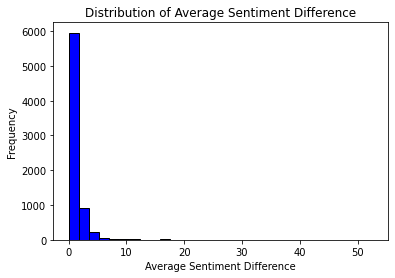

In [58]:
import matplotlib.pyplot as plt

# 绘制直方图
plt.hist(df_non_financials_regression['EarnVol'], bins=30, color='blue', edgecolor='black')
plt.title('Distribution of Average Sentiment Difference')
plt.xlabel('Average Sentiment Difference')
plt.ylabel('Frequency')
plt.show()


In [15]:
# 先按 'Average Sentiment Difference' 分成大于0，等于0，小于0三组
df_non_financials_regression['Sentiment_Group'] = np.select(
    [
        df_non_financials_regression['Average Sentiment Difference'] > 0, 
        df_non_financials_regression['Average Sentiment Difference'] == 0,
        df_non_financials_regression['Average Sentiment Difference'] < 0
    ], 
    [
        'Positive', 
        'Zero', 
        'Negative'
    ], 
    default='Unknown'
)
# 对于小于0的样本，进一步按照中位数进行分组
negative_df = df_non_financials_regression[df_non_financials_regression['Sentiment_Group'] == 'Negative']
median_value = negative_df['Average Sentiment Difference'].median()
negative_df['Subgroup'] = np.where(negative_df['Average Sentiment Difference'] > median_value, 'Below Median', 'Above Median')

# 函数：对每个组进行回归分析
def run_regression(df_group, group_name):
    X = sm.add_constant(df_group[['Average Sentiment Difference','EarnVol', 'Earn','UE', 'Accruals', 'Size', 'MtoB', 'Leverage',
                         'Analysts', 'Spearks','QA Anaylst Average Sentiment','PresentationPreSpeaker_WordCount_Total_log',
                         'QandAPreASpeaker_WordCount_Total_log','QandAPreQAnalyst_WordCount_Total_log'] + list(quarter_dummies.columns) + list(cik_dummies.columns)])
    y = df_group['CAR']

    # 创建模型并拟合数据
    model = sm.OLS(y, X).fit(cov_type='cluster', cov_kwds={'groups': df_group['CIK']})

    # 打印模型结果
    print(f"\n回归分析结果 - {group_name} Group:")
    print(model.summary())

# 分别对所有分组进行回归分析
for group in df_non_financials_regression['Sentiment_Group'].unique():
    df_group = df_non_financials_regression[df_non_financials_regression['Sentiment_Group'] == group]
    run_regression(df_group, group)

# 对小于0的两个子组也进行回归分析
for subgroup in ['Below Median', 'Above Median']:
    df_subgroup = negative_df[negative_df['Subgroup'] == subgroup]
    run_regression(df_subgroup, subgroup)
#寫反了 从命名上看，如果 negative_df['Average Sentiment Difference'] 大于 median_value，按常理应该分到 'Above Median' 组，而不是 'Below Median'。所以你的代码中的命名逻辑似乎是反的

<ipython-input-15-737603c43754>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  negative_df['Subgroup'] = np.where(negative_df['Average Sentiment Difference'] > median_value, 'Below Median', 'Above Median')



回归分析结果 - Positive Group:


c:\Users\accstu\AppData\Local\Programs\Python\Python38\lib\site-packages\statsmodels\base\model.py:1896: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 467, but rank is 50
  warnings.warn('covariance of constraints does not have full '


                            OLS Regression Results                            
Dep. Variable:                    CAR   R-squared:                       0.337
Model:                            OLS   Adj. R-squared:                  0.081
Method:                 Least Squares   F-statistic:                -5.226e+10
Date:                Thu, 06 Jun 2024   Prob (F-statistic):               1.00
Time:                        18:54:26   Log-Likelihood:                -3714.0
No. Observations:                1227   AIC:                             8112.
Df Residuals:                     885   BIC:                             9860.
Df Model:                         341                                         
Covariance Type:              cluster                                         
                                                 coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

c:\Users\accstu\AppData\Local\Programs\Python\Python38\lib\site-packages\statsmodels\base\model.py:1896: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 467, but rank is 51
  warnings.warn('covariance of constraints does not have full '


                            OLS Regression Results                            
Dep. Variable:                    CAR   R-squared:                       0.138
Model:                            OLS   Adj. R-squared:                  0.065
Method:                 Least Squares   F-statistic:                     11.27
Date:                Thu, 06 Jun 2024   Prob (F-statistic):           9.52e-52
Time:                        18:54:27   Log-Likelihood:                -18270.
No. Observations:                5924   AIC:                         3.747e+04
Df Residuals:                    5460   BIC:                         4.057e+04
Df Model:                         463                                         
Covariance Type:              cluster                                         
                                                 coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

c:\Users\accstu\AppData\Local\Programs\Python\Python38\lib\site-packages\statsmodels\base\model.py:1896: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 467, but rank is 51
  warnings.warn('covariance of constraints does not have full '


                            OLS Regression Results                            
Dep. Variable:                    CAR   R-squared:                       0.199
Model:                            OLS   Adj. R-squared:                  0.055
Method:                 Least Squares   F-statistic:                     9.396
Date:                Thu, 06 Jun 2024   Prob (F-statistic):           4.40e-43
Time:                        18:54:28   Log-Likelihood:                -9115.2
No. Observations:                2962   AIC:                         1.914e+04
Df Residuals:                    2508   BIC:                         2.186e+04
Df Model:                         453                                         
Covariance Type:              cluster                                         
                                                 coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

c:\Users\accstu\AppData\Local\Programs\Python\Python38\lib\site-packages\statsmodels\base\model.py:1896: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 467, but rank is 51
  warnings.warn('covariance of constraints does not have full '


In [107]:

# 创建一个新的DataFrame，只包含这些列
desc = df_non_financials_new.describe()

desc.to_csv('sentiment_data_finbert0606.csv')

print("提取的sentiment相关数据已保存为 sentiment_data_finbert.csv")

提取的sentiment相关数据已保存为 sentiment_data_finbert.csv


In [16]:
'''2-2 FinBERT General Pres Tone- CAR 
#overall sample with Winsorization(1,99)'''

#no financials regression
X = sm.add_constant(df_non_financials_regression[['Pre Average Sentiment'] + list(quarter_dummies.columns) + list(cik_dummies.columns)])
y = df_non_financials_regression['CAR']

# 创建模型并拟合数据
model = sm.OLS(y, X).fit(cov_type='cluster', cov_kwds={'groups': df_non_financials_regression['CIK']})


# 打印模型结果
print("columns(1):FinBERT General regression (Pres Tone- CAR) Overall Sample:")
print(model.summary())

FinBERT General overall sample Pres Tone- CAR  with Winsorization(1,99):
                            OLS Regression Results                            
Dep. Variable:                    CAR   R-squared:                       0.093
Model:                            OLS   Adj. R-squared:                  0.031
Method:                 Least Squares   F-statistic:                -3.429e+13
Date:                Thu, 06 Jun 2024   Prob (F-statistic):               1.00
Time:                        19:53:39   Log-Likelihood:                -22335.
No. Observations:                7151   AIC:                         4.558e+04
Df Residuals:                    6696   BIC:                         4.871e+04
Df Model:                         454                                         
Covariance Type:              cluster                                         
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------

c:\Users\accstu\AppData\Local\Programs\Python\Python38\lib\site-packages\statsmodels\base\model.py:1896: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 454, but rank is 39
  warnings.warn('covariance of constraints does not have full '


In [18]:
'''2-3 FinBERT General Answer Tone- CAR 
#overall sample with Winsorization(1,99)'''

#no financials regression
X = sm.add_constant(df_non_financials_regression[['QA Average Sentiment'] + list(quarter_dummies.columns) + list(cik_dummies.columns)])
y = df_non_financials_regression['CAR']

# 创建模型并拟合数据
model = sm.OLS(y, X).fit(cov_type='cluster', cov_kwds={'groups': df_non_financials_regression['CIK']})


# 打印模型结果
print("columns(2):FinBERT General regression (Answer Tone- CAR) Overall Sample:")
print(model.summary())

columns(2):FinBERT General regression (Answer Tone- CAR) Overall Sample:
                            OLS Regression Results                            
Dep. Variable:                    CAR   R-squared:                       0.091
Model:                            OLS   Adj. R-squared:                  0.030
Method:                 Least Squares   F-statistic:                 4.492e+13
Date:                Thu, 06 Jun 2024   Prob (F-statistic):               0.00
Time:                        19:58:39   Log-Likelihood:                -22340.
No. Observations:                7151   AIC:                         4.559e+04
Df Residuals:                    6696   BIC:                         4.872e+04
Df Model:                         454                                         
Covariance Type:              cluster                                         
                           coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------

c:\Users\accstu\AppData\Local\Programs\Python\Python38\lib\site-packages\statsmodels\base\model.py:1896: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 454, but rank is 39
  warnings.warn('covariance of constraints does not have full '


In [20]:
'''2-4 FinBERT General Ques Tone- CAR 
#overall sample with Winsorization(1,99)'''

#no financials regression
X = sm.add_constant(df_non_financials_regression[['QA Anaylst Average Sentiment'] + list(quarter_dummies.columns) + list(cik_dummies.columns)])
y = df_non_financials_regression['CAR']

# 创建模型并拟合数据
model = sm.OLS(y, X).fit(cov_type='cluster', cov_kwds={'groups': df_non_financials_regression['CIK']})


# 打印模型结果
print("columns(3):FinBERT General regression (Ques Tone- CAR) Overall Sample:")
print(model.summary())

columns(3):FinBERT General regression (Ques Tone- CAR) Overall Sample:


c:\Users\accstu\AppData\Local\Programs\Python\Python38\lib\site-packages\statsmodels\base\model.py:1896: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 454, but rank is 39
  warnings.warn('covariance of constraints does not have full '


                            OLS Regression Results                            
Dep. Variable:                    CAR   R-squared:                       0.102
Model:                            OLS   Adj. R-squared:                  0.041
Method:                 Least Squares   F-statistic:                 1.607e+13
Date:                Thu, 06 Jun 2024   Prob (F-statistic):               0.00
Time:                        20:00:00   Log-Likelihood:                -22297.
No. Observations:                7151   AIC:                         4.550e+04
Df Residuals:                    6696   BIC:                         4.863e+04
Df Model:                         454                                         
Covariance Type:              cluster                                         
                                   coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const           

In [128]:
#Find Sample
filtered_data = df_non_financials_new[
    (df_non_financials_new['Average Sentiment Difference'] < -0.2) &
    (df_non_financials_new['Pre Average Sentiment'] > 0) &
    (df_non_financials_new['QA Average Sentiment'] > 0)
]
filtered_data

,Unnamed: 0,Unnamed: 0.1,gvkey,quarter_transformed,title,url,date,GICS Sector,GICS Sub-Industry,CIK,...,QA Sentiment Scores,QA Analyst Sentiment Scores,Pre Weight Sentiment Scores,QA Weight Sentiment Scores,QA Analyst Weight Sentiment Scores,Sentiment Score Weight Differences,Average Weight Sentiment Difference,Pre Weight Average Sentiment,QA Weight Average Sentiment,QA Analyst Weight Average Sentiment
24,24,74,1075,2021Q4,Pinnacle West Capital's (PNW) CEO Jeff Guldner...,https://seekingalpha.com/article/4490681-pinna...,2022-02-25,Utilities,Multi-Utilities,764622.0,...,"{'Jeff Guldner': 0.11538461538461539, 'Ted Gei...","{'Shar Pourreza': 0.26666666666666666, 'Insoo ...","{'Amanda Ho': 0.0, 'Jeff Guldner': 0.471388562...","{'Jeff Guldner': 0.1089225902379501, 'Ted Geis...","{'Shar Pourreza': 0.27848417465041186, 'Insoo ...","{'Ted Geisler': -0.2618588655288481, 'Jeff Gul...",-0.208108,0.296531,0.132634,0.161456
31,31,81,1075,2023Q3,Pinnacle West Capital Corporation (PNW) Q3 202...,https://seekingalpha.com/article/4646768-pinna...,2023-11-02,Utilities,Multi-Utilities,764622.0,...,"{'Jeff Guldner': 0.09090909090909091, 'Andrew ...","{'Shar Pourreza': 0.12, 'Nicholas Campanella':...","{'Amanda Ho': 0.0, 'Jeff Guldner': 0.575190158...","{'Jeff Guldner': 0.09362250833220429, 'Andrew ...","{'Shar Pourreza': 0.11951020581621045, 'Nichol...","{'Jeff Guldner': -0.48156765022465187, 'Amanda...",-0.288311,0.327986,0.059512,0.030375
34,34,115,1078,2021Q2,Abbott Laboratories (ABT) CEO Robert Ford on Q...,https://seekingalpha.com/article/4440671-abbot...,2021-07-22,Health Care,Health Care Equipment,1800.0,...,"{'Robert Ford': 0.2966507177033493, 'Bob Funck...","{'Bob Hopkins': 0.2727272727272727, 'Robbie Ma...","{'Scott Leinenweber': 0.037177603396684286, 'R...","{'Robert Ford': 0.29227373872105006, 'Bob Func...","{'Bob Hopkins': 0.2633930467096103, 'Robbie Ma...","{'Robert Ford': -0.5161940288545128, 'Bob Func...",-0.250805,0.407005,0.156200,0.273341
47,47,161,1161,2022Q1,"Advanced Micro Devices, Inc.'s (AMD) CEO Dr. L...",https://seekingalpha.com/article/4506537-advan...,2022-05-03,Information Technology,Semiconductors,2488.0,...,"{'Victor Peng': 0.26851851851851855, 'Laura Gr...","{'Matt Ramsay': 0.2777777777777778, 'Toshiya H...","{'Laura Graves': 0.6500180843309106, 'Devinder...","{'Victor Peng': 0.2702997746301721, 'Laura Gra...","{'Matt Ramsay': 0.2775041533830062, 'Toshiya H...","{'Laura Graves': -0.4528523031605959, 'Devinde...",-0.251039,0.601879,0.233733,0.278386
48,48,162,1161,2022Q2,"Advanced Micro Devices, Inc.'s (AMD) CEO Lisa ...",https://seekingalpha.com/article/4528901-advan...,2022-08-02,Information Technology,Semiconductors,2488.0,...,"{'Lisa Su': 0.23197492163009403, 'Devinder Kum...","{'Toshiya Hari': 0.1702127659574468, 'Vivek Ar...","{'Laura Graves': -0.03762650572889999, 'Lisa S...","{'Lisa Su': 0.22955551851911452, 'Devinder Kum...","{'Toshiya Hari': 0.1769627455991765, 'Vivek Ar...","{'Laura Graves': 0.25764014325090295, 'Devinde...",-0.224669,0.404644,0.179975,0.223244
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7110,7735,20758,260774,2022Q1,"CBRE Group, Inc. (CBRE) CEO Bob Sulentic on Q1...",https://seekingalpha.com/article/4507475-cbre-...,2022-05-05,Real Estate,Real Estate Services,1138118.0,...,"{'Bob Sulentic': 0.3356164383561644, 'Emma Gia...","{'Chandni Luthra': 0.19607843137254902, 'Steve...","{'Kristyn Farahmand': 0.0, 'Bob Sulentic': 0.6...","{'Bob Sulentic': 0.33323691807732597, 'Emma Gi...","{'Chandni Luthra': 0.202483997076068, 'Steve S...","{'Kristyn Farahmand': 0.0, 'Emma Giamartino': ...",-0.233126,0.387753,0.231941,0.285569
7132,7757,20805,294524,2023Q1,LyondellBasell Industries N.V. (LYB) Q1 2023 E...,https://seekingalpha.com/article/4597825-lyond...,2023-04-28,Materials,Specialty Chemicals,1489393.0,...,"{'Peter Vanacker': 0.22123893805309736, 'Micha...","{'Steve Byrne': 0.11764705882352941, 'Jeff Zek...","{'David Kinney': -0.06932464998304828, 'Pete

In [132]:
df_non_financials_new['QA Average Sentiment'].iloc[7133]

0.0228607947980589

In [22]:
'''3-1 FinBERT Weight All variable-CAR
overall sample with Winsorization(1,99)'''
quarter_dummies = pd.get_dummies(df_non_financials_new['quarter_transformed'], prefix='Qtr', drop_first=True)
cik_dummies = pd.get_dummies(df_non_financials_new['CIK'], prefix='CIK', drop_first=True)

df_non_financials_regression = pd.concat([df_non_financials_new, quarter_dummies, cik_dummies], axis=1)
#no financials regression
X = sm.add_constant(df_non_financials_regression[['Average Weight Sentiment Difference','EarnVol','UE' ,'Earn', 'Accruals', 'Size', 'MtoB', 'Leverage',
                         'Analysts', 'Spearks','QA Analyst Weight Average Sentiment',
                         'PresentationPreSpeaker_WordCount_Total_log',
                         'QandAPreASpeaker_WordCount_Total_log','QandAPreQAnalyst_WordCount_Total_log'] + list(quarter_dummies.columns) + list(cik_dummies.columns)])
y = df_non_financials_regression['CAR']

# 创建模型并拟合数据
model = sm.OLS(y, X).fit(cov_type='cluster', cov_kwds={'groups': df_non_financials_regression['CIK']})


# 打印模型结果
print("columns(4):FinBERT Weight regression overall sample with Winsorization(1,99):")
print(model.summary())

columns(4):FinBERT Weight regression overall sample with Winsorization(1,99):
                            OLS Regression Results                            
Dep. Variable:                    CAR   R-squared:                       0.124
Model:                            OLS   Adj. R-squared:                  0.062
Method:                 Least Squares   F-statistic:                 4.122e+09
Date:                Thu, 06 Jun 2024   Prob (F-statistic):               0.00
Time:                        20:02:01   Log-Likelihood:                -22211.
No. Observations:                7151   AIC:                         4.536e+04
Df Residuals:                    6683   BIC:                         4.857e+04
Df Model:                         467                                         
Covariance Type:              cluster                                         
                                                 coef    std err          z      P>|z|      [0.025      0.975]
---------------------

c:\Users\accstu\AppData\Local\Programs\Python\Python38\lib\site-packages\statsmodels\base\model.py:1896: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 467, but rank is 51
  warnings.warn('covariance of constraints does not have full '


In [25]:
'''3-2 FinBERT Weight Pres Tone- CAR 
#overall sample with Winsorization(1,99)'''

#no financials regression 'QA Analyst Weight Average Sentiment'
X = sm.add_constant(df_non_financials_regression[['Pre Weight Average Sentiment',] + list(quarter_dummies.columns) + list(cik_dummies.columns)])
y = df_non_financials_regression['CAR']

# 创建模型并拟合数据
model = sm.OLS(y, X).fit(cov_type='cluster', cov_kwds={'groups': df_non_financials_regression['CIK']})


# 打印模型结果
print("columns(1):FinBERT Weight regression (Pres Tone- CAR) Overall Sample:")
print(model.summary())


columns(1):FinBERT Weight regression (Pres Tone- CAR) Overall Sample:
                            OLS Regression Results                            
Dep. Variable:                    CAR   R-squared:                       0.093
Model:                            OLS   Adj. R-squared:                  0.032
Method:                 Least Squares   F-statistic:                 5.226e+13
Date:                Thu, 06 Jun 2024   Prob (F-statistic):               0.00
Time:                        20:07:02   Log-Likelihood:                -22334.
No. Observations:                7151   AIC:                         4.558e+04
Df Residuals:                    6696   BIC:                         4.871e+04
Df Model:                         454                                         
Covariance Type:              cluster                                         
                                   coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------

c:\Users\accstu\AppData\Local\Programs\Python\Python38\lib\site-packages\statsmodels\base\model.py:1896: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 454, but rank is 39
  warnings.warn('covariance of constraints does not have full '


In [27]:
'''3-3 FinBERT Weight Answer Tone- CAR 
#overall sample with Winsorization(1,99)'''

#no financials regression 'QA Analyst Weight Average Sentiment'
X = sm.add_constant(df_non_financials_regression[['QA Weight Average Sentiment'] + list(quarter_dummies.columns) + list(cik_dummies.columns)])
y = df_non_financials_regression['CAR']

# 创建模型并拟合数据
model = sm.OLS(y, X).fit(cov_type='cluster', cov_kwds={'groups': df_non_financials_regression['CIK']})


# 打印模型结果
print("columns(2):FinBERT Weight regression (Answer Tone- CAR) Overall Sample:")
print(model.summary())


columns(2):FinBERT Weight regression (Answer Tone- CAR) Overall Sample:
                            OLS Regression Results                            
Dep. Variable:                    CAR   R-squared:                       0.092
Model:                            OLS   Adj. R-squared:                  0.030
Method:                 Least Squares   F-statistic:                -5.088e+13
Date:                Thu, 06 Jun 2024   Prob (F-statistic):               1.00
Time:                        20:07:17   Log-Likelihood:                -22339.
No. Observations:                7151   AIC:                         4.559e+04
Df Residuals:                    6696   BIC:                         4.872e+04
Df Model:                         454                                         
Covariance Type:              cluster                                         
                                  coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------

c:\Users\accstu\AppData\Local\Programs\Python\Python38\lib\site-packages\statsmodels\base\model.py:1896: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 454, but rank is 39
  warnings.warn('covariance of constraints does not have full '


In [24]:
'''3-4 FinBERT Weight Ques Tone- CAR 
#overall sample with Winsorization(1,99)'''

#no financials regression 'QA Analyst Weight Average Sentiment'
X = sm.add_constant(df_non_financials_regression[['QA Analyst Weight Average Sentiment'] + list(quarter_dummies.columns) + list(cik_dummies.columns)])
y = df_non_financials_regression['CAR']

# 创建模型并拟合数据
model = sm.OLS(y, X).fit(cov_type='cluster', cov_kwds={'groups': df_non_financials_regression['CIK']})


# 打印模型结果
print("columns(3):FinBERT Weight regression (Ques Tone- CAR) Overall Sample:")
print(model.summary())


columns(3):FinBERT Weight regression (Ques Tone- CAR) Overall Sample:
                            OLS Regression Results                            
Dep. Variable:                    CAR   R-squared:                       0.103
Model:                            OLS   Adj. R-squared:                  0.042
Method:                 Least Squares   F-statistic:                -7.589e+12
Date:                Thu, 06 Jun 2024   Prob (F-statistic):               1.00
Time:                        20:05:56   Log-Likelihood:                -22296.
No. Observations:                7151   AIC:                         4.550e+04
Df Residuals:                    6696   BIC:                         4.863e+04
Df Model:                         454                                         
Covariance Type:              cluster                                         
                                          coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------

c:\Users\accstu\AppData\Local\Programs\Python\Python38\lib\site-packages\statsmodels\base\model.py:1896: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 454, but rank is 39
  warnings.warn('covariance of constraints does not have full '


In [29]:
'''3-5 FinBERT Weight Group 
#overall sample with Winsorization(1,99)'''
# 先按 'Average Sentiment Difference' 分成大于0，等于0，小于0三组
df_non_financials_regression['Sentiment_Weight_Group'] = np.select(
    [
        df_non_financials_regression['Average Weight Sentiment Difference'] > 0, 
        df_non_financials_regression['Average Weight Sentiment Difference'] == 0,
        df_non_financials_regression['Average Weight Sentiment Difference'] < 0
    ], 
    [
        'Positive', 
        'Zero', 
        'Negative'
    ], 
    default='Unknown'
)
# 对于小于0的样本，进一步按照中位数进行分组
negative_weight_df = df_non_financials_regression[df_non_financials_regression['Sentiment_Weight_Group'] == 'Negative']
median_weight_value = negative_weight_df['Average Weight Sentiment Difference'].median()
negative_weight_df['Subgroup'] = np.where(negative_weight_df['Average Weight Sentiment Difference'] > median_weight_value, 'Below Median', 'Above Median')

# 函数：对每个组进行回归分析
def run_weight_regression(df_group, group_name):
    X = sm.add_constant(df_group[['Average Weight Sentiment Difference','EarnVol','UE' ,'Earn', 'Accruals', 'Size', 'MtoB', 'Leverage',
                            'Analysts', 'Spearks','QA Analyst Weight Average Sentiment',
                            'PresentationPreSpeaker_WordCount_Total_log',
                            'QandAPreASpeaker_WordCount_Total_log','QandAPreQAnalyst_WordCount_Total_log'] + list(quarter_dummies.columns) + list(cik_dummies.columns)])
    y = df_group['CAR']

    # 创建模型并拟合数据
    model = sm.OLS(y, X).fit(cov_type='cluster', cov_kwds={'groups': df_group['CIK']})

    # 打印模型结果
    print(f"\n回归分析结果 - {group_name} Group:")
    print(model.summary())

# 分别对所有分组进行回归分析
for group in df_non_financials_regression['Sentiment_Weight_Group'].unique():
    df_group = df_non_financials_regression[df_non_financials_regression['Sentiment_Weight_Group'] == group]
    run_weight_regression(df_group, group)

# 对小于0的两个子组也进行回归分析
for subgroup in ['Below Median', 'Above Median']:
    df_subgroup = negative_weight_df[negative_weight_df['Subgroup'] == subgroup]
    run_weight_regression(df_subgroup, subgroup)


<ipython-input-29-bb0f9a4a36ca>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  negative_weight_df['Subgroup'] = np.where(negative_weight_df['Average Weight Sentiment Difference'] > median_weight_value, 'Below Median', 'Above Median')



回归分析结果 - Positive Group:


c:\Users\accstu\AppData\Local\Programs\Python\Python38\lib\site-packages\statsmodels\base\model.py:1896: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 467, but rank is 50
  warnings.warn('covariance of constraints does not have full '


                            OLS Regression Results                            
Dep. Variable:                    CAR   R-squared:                       0.364
Model:                            OLS   Adj. R-squared:                  0.101
Method:                 Least Squares   F-statistic:                -3.552e+10
Date:                Thu, 06 Jun 2024   Prob (F-statistic):               1.00
Time:                        20:14:13   Log-Likelihood:                -3423.5
No. Observations:                1138   AIC:                             7515.
Df Residuals:                     804   BIC:                             9197.
Df Model:                         333                                         
Covariance Type:              cluster                                         
                                                 coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

c:\Users\accstu\AppData\Local\Programs\Python\Python38\lib\site-packages\statsmodels\base\model.py:1896: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 467, but rank is 51
  warnings.warn('covariance of constraints does not have full '


                            OLS Regression Results                            
Dep. Variable:                    CAR   R-squared:                       0.137
Model:                            OLS   Adj. R-squared:                  0.065
Method:                 Least Squares   F-statistic:                     13.29
Date:                Thu, 06 Jun 2024   Prob (F-statistic):           6.42e-60
Time:                        20:14:15   Log-Likelihood:                -18553.
No. Observations:                6013   AIC:                         3.803e+04
Df Residuals:                    5549   BIC:                         4.114e+04
Df Model:                         463                                         
Covariance Type:              cluster                                         
                                                 coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

c:\Users\accstu\AppData\Local\Programs\Python\Python38\lib\site-packages\statsmodels\base\model.py:1896: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 467, but rank is 51
  warnings.warn('covariance of constraints does not have full '


                            OLS Regression Results                            
Dep. Variable:                    CAR   R-squared:                       0.194
Model:                            OLS   Adj. R-squared:                  0.051
Method:                 Least Squares   F-statistic:                     7.916
Date:                Thu, 06 Jun 2024   Prob (F-statistic):           4.22e-36
Time:                        20:14:15   Log-Likelihood:                -9261.2
No. Observations:                3006   AIC:                         1.943e+04
Df Residuals:                    2553   BIC:                         2.215e+04
Df Model:                         452                                         
Covariance Type:              cluster                                         
                                                 coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

c:\Users\accstu\AppData\Local\Programs\Python\Python38\lib\site-packages\statsmodels\base\model.py:1896: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 467, but rank is 51
  warnings.warn('covariance of constraints does not have full '


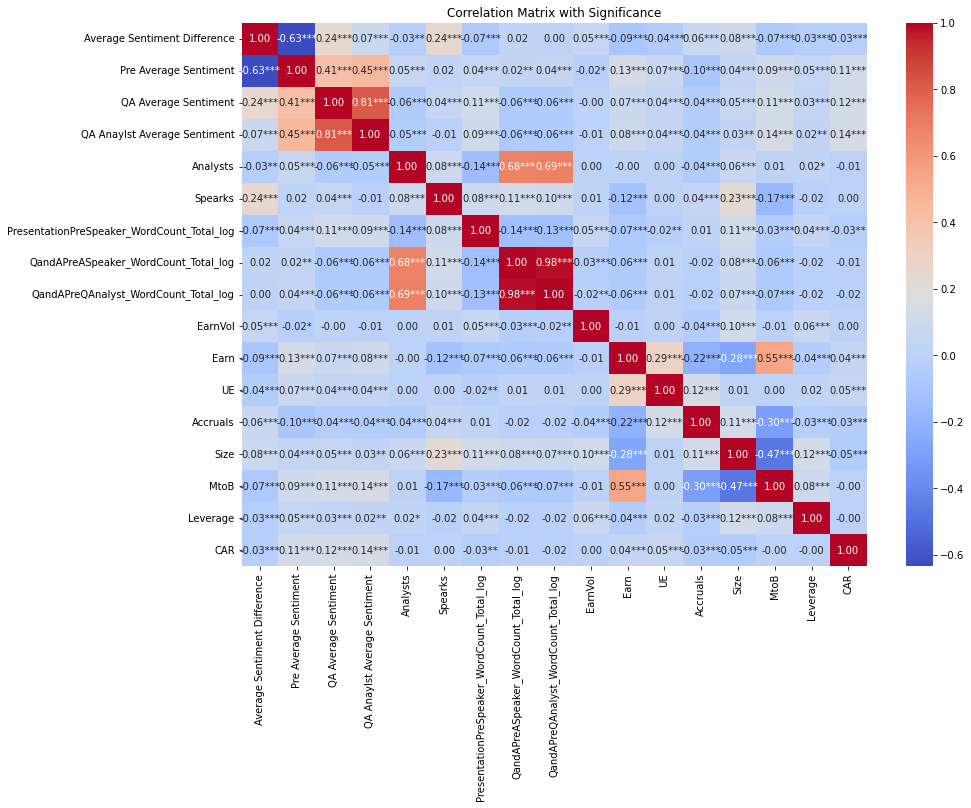

导出完成，文件名为 'correlation_and_pvalues.csv'


In [99]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
import itertools
# 假设 df 是包含所有数据的 DataFrame
df_co = df_non_financials_new[['Average Sentiment Difference', 'Pre Average Sentiment'	,'QA Average Sentiment','QA Anaylst Average Sentiment',
                                   'Analysts', 'Spearks',  'PresentationPreSpeaker_WordCount_Total_log',
                                   'QandAPreASpeaker_WordCount_Total_log', 'QandAPreQAnalyst_WordCount_Total_log',
'EarnVol', 'Earn', 'UE', 'Accruals', 'Size', 'MtoB', 'Leverage','CAR']]

corr_matrix = df_co.corr()
p_values = pd.DataFrame(index=df_co.columns, columns=df_co.columns)

# 填充p值矩阵
for col1, col2 in itertools.combinations(df_co.columns, 2):
    corr, p = pearsonr(df_co[col1].dropna(), df_co[col2].dropna())
    p_values.at[col1, col2] = p
    p_values.at[col2, col1] = p

# 创建带星号的注释矩阵
annotations = corr_matrix.applymap(lambda x: f"{x:.2f}")
for i in range(p_values.shape[0]):
    for j in range(p_values.shape[1]):
        if i != j:
            p = float(p_values.iloc[i, j])
            if p < 0.01:
                annotations.iloc[i, j] += '***'  # p < 0.01
            elif p < 0.05:
                annotations.iloc[i, j] += '**'   # p < 0.05
            elif p < 0.1:
                annotations.iloc[i, j] += '*'    # p < 0.1

# 可视化相关系数矩阵
plt.figure(figsize=(14, 10))
sns.heatmap(corr_matrix, annot=annotations, cmap='coolwarm', fmt="")
plt.title('Correlation Matrix with Significance')
plt.show()
# 创建一个新的 DataFrame 用于输出
output_df = pd.DataFrame(index=df_co.columns, columns=df_co.columns)

# 填充新 DataFrame，将相关系数和 p 值放在一起
for col in output_df.columns:
    for row in output_df.index:
        corr_value = corr_matrix.at[row, col]
        p_value = p_values.at[row, col]
        output_df.at[row, col] = f"{corr_value:.3f} (p={p_value:.3g})"

# 导出到 CSV 文件
output_df.to_csv("Finbert_General_overall_correlation_and_pvalues.csv")

print("导出完成，文件名为 'correlation_and_pvalues.csv'")

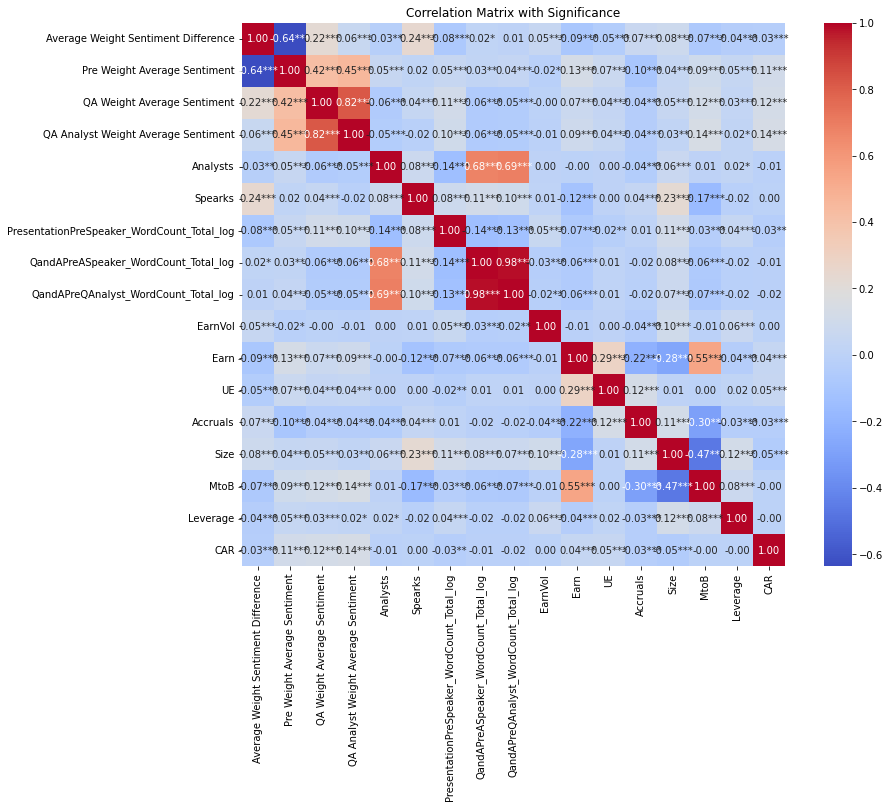

导出完成，文件名为 'Finbert_Weight_overall_correlation_and_pvalues.csv'


In [101]:
df_weight_co = df_non_financials_new[['Average Weight Sentiment Difference', 'Pre Weight Average Sentiment'	,'QA Weight Average Sentiment','QA Analyst Weight Average Sentiment',
                                   'Analysts', 'Spearks',  'PresentationPreSpeaker_WordCount_Total_log',
                                   'QandAPreASpeaker_WordCount_Total_log', 'QandAPreQAnalyst_WordCount_Total_log',
'EarnVol', 'Earn', 'UE', 'Accruals', 'Size', 'MtoB', 'Leverage','CAR']]

# 计算相关系数矩阵
corr_matrix = df_weight_co.corr()

# 初始化 p 值矩阵
p_values = pd.DataFrame(np.zeros_like(corr_matrix), columns=df_weight_co.columns, index=df_weight_co.columns)

# 填充 p 值矩阵
for col1, col2 in itertools.combinations(df_weight_co.columns, 2):
    corr, p = pearsonr(df_weight_co[col1].dropna(), df_weight_co[col2].dropna())
    p_values.at[col1, col2] = p
    p_values.at[col2, col1] = p

# 创建带星号的注释矩阵
annotations = corr_matrix.applymap(lambda x: f"{x:.2f}")
for i in range(p_values.shape[0]):
    for j in range(p_values.shape[1]):
        if i != j:
            p = float(p_values.iloc[i, j])
            if p < 0.01:
                annotations.iloc[i, j] += '***'  # p < 0.01
            elif p < 0.05:
                annotations.iloc[i, j] += '**'   # p < 0.05
            elif p < 0.1:
                annotations.iloc[i, j] += '*'    # p < 0.1

# 可视化相关系数矩阵
plt.figure(figsize=(14, 10))
sns.heatmap(corr_matrix, annot=annotations, cmap='coolwarm', fmt="", cbar=True, square=True)
plt.title('Correlation Matrix with Significance')
plt.show()

# 创建一个新的 DataFrame 用于输出
output_df = pd.DataFrame(index=df_weight_co.columns, columns=df_weight_co.columns)

# 填充新 DataFrame，将相关系数和 p 值放在一起
for col in output_df.columns:
    for row in output_df.index:
        corr_value = corr_matrix.at[row, col]
        p_value = p_values.at[row, col]
        output_df.at[row, col] = f"{corr_value:.3f} (p={p_value:.3g})"

# 导出到 CSV 文件
output_df.to_csv("Finbert_Weight_overall_correlation_and_pvalues.csv")

print("导出完成，文件名为 'Finbert_Weight_overall_correlation_and_pvalues.csv'")

In [30]:
'''CEO'''
'''CEO'''
CEO = pd.read_csv('D:\Script\CEO.csv',low_memory=False)
# 删除 'url' 列中的重复值，保留每个重复组的第一个值
CEO_unique = CEO.drop_duplicates(subset=['url'], keep='first')

df_CEO = df_non_financials_new.merge(
    CEO,
    how='inner',  # 只保留两个数据集中都有匹配的行
    left_on=['url'],  # df_sandp500_ECT_wrds_compustat_event
    right_on=['url']  # wrds_evebt中用于匹配的列
)
df_CEO = df_CEO.drop_duplicates(subset=['url'], keep='first')

In [31]:
df_CEO

,Unnamed: 0,Unnamed: 0.1,gvkey,quarter_transformed,title,url,date,GICS Sector,GICS Sub-Industry,CIK,...,QA Analyst Sentiment Scores,Pre Weight Sentiment Scores,QA Weight Sentiment Scores,QA Analyst Weight Sentiment Scores,Sentiment Score Weight Differences,Average Weight Sentiment Difference,Pre Weight Average Sentiment,QA Weight Average Sentiment,QA Analyst Weight Average Sentiment,CEO
0,0,0,1045,2014Q1,"American Airlines (AAL) CEO, Doug Parker on Q1...",https://seekingalpha.com/article/4341573-ameri...,2020-04-30,Industrials,Passenger Airlines,6201.0,...,"{'David Vernon': 0.0, 'Mike Linenberg': 0.125,...","{'Dan Cravens': 0.04980888250228646, 'Doug Par...","{'Derek Kerr': 0.1567717466743772, 'Doug Parke...","{'David Vernon': 0.0, 'Mike Linenberg': 0.1104...","{'Dan Cravens': -0.04980888250228646, 'Derek K...",0.007068,0.167459,0.142449,0.138374,['Doug Parker']
1,1,25,1045,2020Q2,American Airlines Group Inc. (AAL) CEO Doug Pa...,https://seekingalpha.com/article/4360357-ameri...,2020-07-23,Industrials,Passenger Airlines,6201.0,...,"{'Helane Becker': -0.024390243902439025, 'Davi...","{'Dan Cravens': 0.05878230992166762, 'Doug Par...","{'Doug Parker': 0.14192261175075785, 'Derek Ke...","{'Helane Becker': 0.009669281103902963, 'David...","{'Derek Kerr': -0.14124079324569316, 'Robert I...",0.024216,0.137876,0.133677,0.107648,['Doug Parker']
2,2,26,1045,2020Q3,American Airlines Group Inc. (AAL) CEO Doug Pa...,https://seekingalpha.com/article/4380763-ameri...,2020-10-22,Industrials,Passenger Airlines,6201.0,...,"{'Brandon Oglenski': 0.24324324324324326, 'Mik...","{'Dan Cravens': 0.10488813892121931, 'Doug Par...","{'Doug Parker': 0.20795018742346158, 'Vasu Raj...","{'Brandon Oglenski': 0.25745831586398654, 'Mik...","{'David Seymour': 0.18675327867503763, 'Dan Cr...",0.014059,0.257927,0.188354,0.136896,['Doug Parker']
3,3,27,1045,2020Q4,American Airlines Group's (AAL) CEO Doug Parke...,https://seekingalpha.com/article/4401834-ameri...,2021-01-28,Industrials,Passenger Airlines,6201.0,...,"{'David Vernon': 0.04, 'Savi Syth': 0.11111111...","{'Dan Cravens': 0.06326908737199656, 'Doug Par...","{'Doug Parker': 0.09239351036582469, 'Robert I...","{'David Vernon': 0.03896219519017738, 'Savi Sy...","{'Steve Johnson': 0.528523339882979, 'Dan Crav...",0.001643,0.307821,0.207130,0.133398,['Doug Parker']
4,4,28,1045,2021Q1,"American Airlines Group, Inc. (AAL) CEO Doug P...",https://seekingalpha.com/article/4420728-ameri...,2021-04-22,Industrials,Passenger Airlines,6201.0,...,"{'Joseph DeNardi': 0.17647058823529413, 'Mike ...","{'Daniel Cravens': 0.06036281058793376, 'Doug ...","{'Doug Parker': 0.08777707552830215, 'Robert I...","{'Joseph DeNardi': 0.18641224317196214, 'Mike ...","{'Daniel Cravens': -0.06036281058793376, 'Dere...",-0.131942,0.289322,0.124395,0.145984,['Doug Parker']
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7178,7772,20846,316056,2022Q3,Allegion plc (ALLE) Q3 2022 Earnings Call Tran...,https://seekingalpha.com/article/4549821-alleg...,2022-10-27,Industrials,Building Products,1579241.0,...,"{'Josh Pokrzywinski': 0.30303030303030304, 'Ry...","{'Tom Martineau': 0.06063211351930103, 'John S...","{'John Stone': 0.30123462489595193, 'Mike Wagn...","{'Josh Pokrzywinski': 0.2829772302474903, 'Rya...","{'Tom Martineau': -0.06063211351930103, 'John ...",-0.083134,0.293601,0.315700,0.352471,['John Stone']
7179,7773,20847,316056,2022Q4,Allegion plc (ALLE) Q4 2022 Earnings Call Tran...,https://seekingalpha.com/article/4580712-alleg...,2023-02-22,Industrials,Building Products,1579241.0,...,"{'Joe O'Dea': 0.2702702702702703, 'Vivek Sriva...","{'Tom Martineau': 0.11077003402287547, 'John S...","{'John Stone': 0.31933477663622833, 'Mike Wagn...","{'Joe O'Dea': 0.2562006823240968, 'Vivek Sriva...","{'Tom Martineau': -0.11077003402287547, 'John ...",-0.130136,0.283448,0.229967,0.243767,['John Stone']
7180,7774,20848,316056,2023Q1,Allegion plc (ALLE) Q1 2023 Earnings Call Tran...,https://seekingalpha.com

In [34]:
import ast

def parse_string_to_list(row):
    try:
        # 尝试将字符串解析为列表
        return ast.literal_eval(row)
    except:
        # 如果解析失败，返回空列表
        return []

# 应用这个转换到 CallParticipants 列
df_CEO['CallParticipants'] = df_CEO['CallParticipants'].apply(parse_string_to_list)
df_CEO['CEO'] = df_CEO['CEO'].apply(parse_string_to_list)

# 定义一个函数，将字符串形式的字典转换为字典
def convert_to_dict(value):
    if isinstance(value, str):
        try:
            return ast.literal_eval(value)
        except (ValueError, SyntaxError):
            return None
    return value
 
df_CEO['Sentiment Score Differences'] = df_CEO['Sentiment Score Differences'].apply(convert_to_dict)
df_CEO['Sentiment Score Weight Differences'] = df_CEO['Sentiment Score Weight Differences'].apply(convert_to_dict)


In [39]:
df_CEO['Pre Sentiment Scores']

0       {'Dan Cravens': 0.05, 'Doug Parker': 0.1132075...
1       {'Dan Cravens': 0.058823529411764705, 'Doug Pa...
2       {'Dan Cravens': 0.10526315789473684, 'Doug Par...
3       {'Dan Cravens': 0.0625, 'Doug Parker': 0.5, 'R...
4       {'Daniel Cravens': 0.058823529411764705, 'Doug...
                              ...                        
7178    {'Tom Martineau': 0.0625, 'John Stone': 0.5507...
7179    {'Tom Martineau': 0.11538461538461539, 'John S...
7180    {'Tom Martineau': 0.07142857142857142, 'John S...
7181    {'Jobi Coyle': 0.07692307692307693, 'John Ston...
7182    {'Jobi Coyle': 0.07692307692307693, 'John Ston...
Name: Pre Sentiment Scores, Length: 7151, dtype: object

In [35]:
#CEO Finbert General 
df_CEO['PresentationPreSpeaker_WordCount'] = df_CEO['PresentationPreSpeaker_WordCount'].apply(convert_to_dict)
df_CEO['QandAPreASpeaker_WordCount'] = df_CEO['QandAPreASpeaker_WordCount'].apply(convert_to_dict)

def extract_ceo_sentiment_and_wordcount(row):
    ceo_dict = row['Sentiment Score Differences']
    pres_word_count_dict = row['PresentationPreSpeaker_WordCount']
    qanda_word_count_dict = row['QandAPreASpeaker_WordCount']
    ceo_name_list = row['CEO']
    
    if isinstance(ceo_name_list, list):
        if len(ceo_name_list) == 1:
            ceo_name = ceo_name_list[0].strip().strip("'")  # 从列表中提取名字，并去掉多余的单引号和空白字符
            if ceo_name in ceo_dict:
                ceo_sentiment = ceo_dict[ceo_name]
            else:
                ceo_sentiment = None
            
            pres_word_count = pres_word_count_dict.get(ceo_name, None)
            qanda_word_count = qanda_word_count_dict.get(ceo_name, None)
            
            return {
                'ceo_sentiment': ceo_sentiment,
                'pres_word_count': pres_word_count,
                'qanda_word_count': qanda_word_count
            }
    
    return {
        'ceo_sentiment': None,
        'pres_word_count': None,
        'qanda_word_count': None
    }

# 在 'Sentiment Score Differences' 列中应用函数，提取 CEO 的情绪分数和词数
df_CEO['CEO_Sentiment_WordCount'] = df_CEO.apply(extract_ceo_sentiment_and_wordcount, axis=1)

# 分别创建 'CEO_Sentiment', 'Pres_WordCount' 和 'QandA_WordCount' 列
df_CEO['CEO_Sentiment'] = df_CEO['CEO_Sentiment_WordCount'].apply(lambda x: x['ceo_sentiment'])
df_CEO['Pres_WordCount'] = df_CEO['CEO_Sentiment_WordCount'].apply(lambda x: x['pres_word_count'])
df_CEO['QandA_WordCount'] = df_CEO['CEO_Sentiment_WordCount'].apply(lambda x: x['qanda_word_count'])


In [79]:
df_CEO.to_csv('CEO_Finbert.csv')

In [115]:
df_CEO['Sentiment Score Differences']

0       {'Dan Cravens': -0.05, 'Derek Kerr': -0.122670...
1       {'Derek Kerr': -0.14293931550186942, 'Robert I...
2       {'David Seymour': 0.1724137931034483, 'Dan Cra...
3       {'Steve Johnson': 0.5, 'Dan Cravens': -0.0625,...
4       {'Daniel Cravens': -0.058823529411764705, 'Der...
                              ...                        
7178    {'Tom Martineau': -0.0625, 'John Stone': -0.24...
7179    {'Tom Martineau': -0.11538461538461539, 'John ...
7180    {'Tom Martineau': -0.07142857142857142, 'John ...
7181    {'Jobi Coyle': -0.07692307692307693, 'John Sto...
7182    {'Jobi Coyle': -0.07692307692307693, 'John Sto...
Name: Sentiment Score Differences, Length: 6318, dtype: object

In [36]:
#CEO Finbert Weight 
df_CEO['PresentationPreSpeaker_WordCount'] = df_CEO['PresentationPreSpeaker_WordCount'].apply(convert_to_dict)
df_CEO['QandAPreASpeaker_WordCount'] = df_CEO['QandAPreASpeaker_WordCount'].apply(convert_to_dict)

def extract_ceo_sentiment_and_wordcount(row):
    ceo_dict = row['Sentiment Score Weight Differences']
    pres_word_count_dict = row['PresentationPreSpeaker_WordCount']
    qanda_word_count_dict = row['QandAPreASpeaker_WordCount']
    ceo_name_list = row['CEO']
    
    if isinstance(ceo_name_list, list):
        if len(ceo_name_list) == 1:
            ceo_name = ceo_name_list[0].strip().strip("'")  # 从列表中提取名字，并去掉多余的单引号和空白字符
            if ceo_name in ceo_dict:
                ceo_sentiment = ceo_dict[ceo_name]
            else:
                ceo_sentiment = None
            
            pres_word_count = pres_word_count_dict.get(ceo_name, None)
            qanda_word_count = qanda_word_count_dict.get(ceo_name, None)
            
            return {
                'ceo_sentiment': ceo_sentiment,
                'pres_word_count': pres_word_count,
                'qanda_word_count': qanda_word_count
            }
    
    return {
        'ceo_sentiment': None,
        'pres_word_count': None,
        'qanda_word_count': None
    }

# 在 'Sentiment Score Differences' 列中应用函数，提取 CEO 的情绪分数和词数
df_CEO['CEO_Weight_Sentiment_WordCount'] = df_CEO.apply(extract_ceo_sentiment_and_wordcount, axis=1)

# 分别创建 'CEO_Sentiment', 'Pres_WordCount' 和 'QandA_WordCount' 列
df_CEO['CEO_Weight_Sentiment'] = df_CEO['CEO_Weight_Sentiment_WordCount'].apply(lambda x: x['ceo_sentiment'])



In [37]:
def find_ceo_in_qanda(row):
    ceo_name = row['CEO'][0] if row['CEO'] and len(row['CEO']) > 0 else None
    if not ceo_name:
        return None  # 如果没有 CEO 名字，则不进行检查

    q_and_a = row['QandA']
    participants = row['CallParticipants']

    # 初始化记录提到 CEO 的参与者列表
    mentioned_by = []

    if len(participants) > 0:
        for i in range(len(participants) - 1):
            try:
                # 查找第一个参与者在 QandA 中的第一次出现
                start_pos = q_and_a.index(participants[i])
                # 查找第二个参与者在 QandA 中的第一次出现
                end_pos = q_and_a.index(participants[i+1], start_pos)
                # 检查两者之间的文本是否包含 CEO 名字
                if ceo_name in q_and_a[start_pos:end_pos]:
                    mentioned_by.append(participants[i])
            except ValueError:
                continue  # 如果找不到这个参与者的名字，跳过

        # 检查最后一个参与者
        try:
            last_start_pos = q_and_a.index(participants[-1])
            if ceo_name in q_and_a[last_start_pos:]:
                mentioned_by.append(participants[-1])
        except ValueError:
            pass  # 如果找不到最后一个参与者的名字，跳过

    return mentioned_by if mentioned_by else None

# 应用这个函数到 DataFrame
df_CEO['AskertoCEO'] = df_CEO.apply(find_ceo_in_qanda, axis=1)




In [40]:
df_CEO['QandAPreQAnalyst_Sentiment'] = df_CEO['QA Analyst Sentiment Scores'].apply(convert_to_dict)
df_CEO['QandAPreQAnalyst_WordCount'] = df_CEO['QandAPreQAnalyst_WordCount'].apply(convert_to_dict)

def extract_Asker_sentiment_and_wordcount(row):
    ceo_dict = row['QandAPreQAnalyst_Sentiment']
    word_count_dict = row['QandAPreQAnalyst_WordCount']
    askers = row['AskertoCEO']
    
    if isinstance(askers, list):  # 检查 askers 是否是列表
        total_score = 0
        total_word_count = 0
        count = 0
        for asker in askers:
            # 在情绪分数字典中查找每个问问题的人的分数
            if asker in ceo_dict:
                total_score += ceo_dict[asker]
                count += 1
            # 在词数字典中查找每个问问题的人的词数
            if asker in word_count_dict:
                total_word_count += word_count_dict[asker]
        
        if count > 0:
            avg_sentiment = total_score / count  # 计算平均情绪分数
            return {'avg_sentiment': avg_sentiment, 'total_word_count': total_word_count}
    return {'avg_sentiment': None, 'total_word_count': None}  # 如果没有有效的问问题的人或没有情绪分数，返回 None

# 在 'Asker_Sentiment_WordCount' 列中应用函数，提取提问者的平均情绪分数和词数
df_CEO['Asker_Sentiment_WordCount'] = df_CEO.apply(extract_Asker_sentiment_and_wordcount, axis=1)

# 分别创建 'Asker_Sentiment' 和 'Asker_WordCount' 列
df_CEO['Asker_Sentiment'] = df_CEO['Asker_Sentiment_WordCount'].apply(lambda x: x['avg_sentiment'])
df_CEO['Asker_WordCount'] = df_CEO['Asker_Sentiment_WordCount'].apply(lambda x: x['total_word_count'])



In [43]:
#FinBERT WEIGHT asker 
df_CEO['QandAPreQAnalyst_Weight_Sentiment'] = df_CEO['QA Analyst Weight Sentiment Scores'].apply(convert_to_dict)


def extract_Weight_Asker_sentiment_and_wordcount(row):
    ceo_dict = row['QandAPreQAnalyst_Weight_Sentiment']
    word_count_dict = row['QandAPreQAnalyst_WordCount']
    askers = row['AskertoCEO']
    
    if isinstance(askers, list):  # 检查 askers 是否是列表
        total_score = 0
        total_word_count = 0
        count = 0
        for asker in askers:
            # 在情绪分数字典中查找每个问问题的人的分数
            if asker in ceo_dict:
                total_score += ceo_dict[asker]
                count += 1
            # 在词数字典中查找每个问问题的人的词数
            if asker in word_count_dict:
                total_word_count += word_count_dict[asker]
        
        if count > 0:
            avg_sentiment = total_score / count  # 计算平均情绪分数
            return {'avg_sentiment': avg_sentiment, 'total_word_count': total_word_count}
    return {'avg_sentiment': None, 'total_word_count': None}  # 如果没有有效的问问题的人或没有情绪分数，返回 None

# 在 'Asker_Sentiment_WordCount' 列中应用函数，提取提问者的平均情绪分数和词数
df_CEO['Asker_Weight_Sentiment_WordCount'] = df_CEO.apply(extract_Weight_Asker_sentiment_and_wordcount, axis=1)

# 分别创建 'Asker_Sentiment' 和 'Asker_WordCount' 列
df_CEO['Asker_Weight_Sentiment'] = df_CEO['Asker_Weight_Sentiment_WordCount'].apply(lambda x: x['avg_sentiment'])
df_CEO['Asker_Weight_Sentiment'] 

0       0.138280
1       0.087563
2       0.195893
3       0.130323
4       0.116239
          ...   
7178    0.352471
7179    0.256085
7180    0.305061
7181    0.241169
7182    0.179249
Name: Asker_Weight_Sentiment, Length: 7151, dtype: float64

In [44]:
# 定义一个函数，将字符串形式的字典转换为字典
def convert_to_dict(value):
    if isinstance(value, str):
        try:
            return ast.literal_eval(value)
        except (ValueError, SyntaxError):
            return None
    return value

# 确保 'Pre Sentiment Scores' 和 'QA Sentiment Scores' 列中的字符串形式字典转换为实际字典
df_CEO['PresentationPreSpeaker_Sentiment'] = df_CEO['Pre Sentiment Scores'].apply(convert_to_dict)
df_CEO['QandAPreASpeaker_Sentiment'] = df_CEO['QA Sentiment Scores'].apply(convert_to_dict)
df_CEO['PresentationPreSpeaker_Weight_Sentiment'] = df_CEO['Pre Weight Sentiment Scores'].apply(convert_to_dict)
df_CEO['QandAPreASpeaker_Weight_Sentiment'] = df_CEO['QA Weight Sentiment Scores'].apply(convert_to_dict)

def extract_ceo_sentiment(row):
    pre_sentiment_dict = row['PresentationPreSpeaker_Sentiment']
    qa_sentiment_dict = row['QandAPreASpeaker_Sentiment']
    ceo_name_list = row['CEO']
    
    if isinstance(ceo_name_list, list) and len(ceo_name_list) == 1:
        ceo_name = ceo_name_list[0].strip().strip("'")  # 从列表中提取名字，并去掉多余的单引号和空白字符
        
        pre_avg_sentiment = pre_sentiment_dict.get(ceo_name, None) if pre_sentiment_dict else None
        qa_avg_sentiment = qa_sentiment_dict.get(ceo_name, None) if qa_sentiment_dict else None
        
        return {
            'pre_avg_sentiment': pre_avg_sentiment,
            'qa_avg_sentiment': qa_avg_sentiment
        }
    
    return {
        'pre_avg_sentiment': None,
        'qa_avg_sentiment': None
    }

# 在 'Pre Sentiment Scores' 和 'QA Sentiment Scores' 列中应用函数，提取 CEO 的情绪分数
df_CEO['CEO_Sentiments'] = df_CEO.apply(extract_ceo_sentiment, axis=1)

# 分别创建 'Pre_Avg_Sentiment' 和 'QA_Avg_Sentiment' 列
df_CEO['Pre_CEO_Sentiment'] = df_CEO['CEO_Sentiments'].apply(lambda x: x['pre_avg_sentiment'])
df_CEO['QA_CEO_Sentiment'] = df_CEO['CEO_Sentiments'].apply(lambda x: x['qa_avg_sentiment'])

# 删除临时列
df_CEO.drop(columns=['CEO_Sentiments'], inplace=True)


In [45]:
def extract_ceo_Weight_sentiment(row):
    pre_sentiment_dict = row['PresentationPreSpeaker_Weight_Sentiment']
    qa_sentiment_dict = row['QandAPreASpeaker_Weight_Sentiment']
    ceo_name_list = row['CEO']
    
    if isinstance(ceo_name_list, list) and len(ceo_name_list) == 1:
        ceo_name = ceo_name_list[0].strip().strip("'")  # 从列表中提取名字，并去掉多余的单引号和空白字符
        
        pre_avg_sentiment = pre_sentiment_dict.get(ceo_name, None) if pre_sentiment_dict else None
        qa_avg_sentiment = qa_sentiment_dict.get(ceo_name, None) if qa_sentiment_dict else None
        
        return {
            'pre_avg_sentiment': pre_avg_sentiment,
            'qa_avg_sentiment': qa_avg_sentiment
        }
    
    return {
        'pre_avg_sentiment': None,
        'qa_avg_sentiment': None
    }

# 在 'Pre Sentiment Scores' 和 'QA Sentiment Scores' 列中应用函数，提取 CEO 的情绪分数
df_CEO['CEO_Weight_Sentiments'] = df_CEO.apply(extract_ceo_Weight_sentiment, axis=1)

# 分别创建 'Pre_Avg_Sentiment' 和 'QA_Avg_Sentiment' 列
df_CEO['Pre_CEO_Weight_Sentiment'] = df_CEO['CEO_Weight_Sentiments'].apply(lambda x: x['pre_avg_sentiment'])
df_CEO['QA_CEO_Weight_Sentiment'] = df_CEO['CEO_Weight_Sentiments'].apply(lambda x: x['qa_avg_sentiment'])

# 删除临时列
df_CEO.drop(columns=['CEO_Weight_Sentiments'], inplace=True)

In [47]:
# 对词数列进行自然对数转换并加1
df_CEO['Log_Pres_WordCount'] = np.log(df_CEO['Pres_WordCount'] + 1)
df_CEO['Log_QandA_WordCount'] = np.log(df_CEO['QandA_WordCount'] + 1)
df_CEO['Log_Asker_WordCount'] = np.log(df_CEO['Asker_WordCount'] + 1)


In [48]:

df_CEO= df_CEO.dropna()
df_CEO

,Unnamed: 0,Unnamed: 0.1,gvkey,quarter_transformed,title,url,date,GICS Sector,GICS Sub-Industry,CIK,...,Asker_Weight_Sentiment,PresentationPreSpeaker_Weight_Sentiment,QandAPreASpeaker_Weight_Sentiment,Pre_CEO_Sentiment,QA_CEO_Sentiment,Pre_CEO_Weight_Sentiment,QA_CEO_Weight_Sentiment,Log_Pres_WordCount,Log_QandA_WordCount,Log_Asker_WordCount
0,0,0,1045,2014Q1,"American Airlines (AAL) CEO, Doug Parker on Q1...",https://seekingalpha.com/article/4341573-ameri...,2020-04-30,Industrials,Passenger Airlines,6201.0,...,0.138280,"{'Dan Cravens': 0.04980888250228646, 'Doug Par...","{'Derek Kerr': 0.1567717466743772, 'Doug Parke...",0.113208,0.143939,0.115252,0.141294,7.280008,8.203304,8.550048
1,1,25,1045,2020Q2,American Airlines Group Inc. (AAL) CEO Doug Pa...,https://seekingalpha.com/article/4360357-ameri...,2020-07-23,Industrials,Passenger Airlines,6201.0,...,0.087563,"{'Dan Cravens': 0.05878230992166762, 'Doug Par...","{'Doug Parker': 0.14192261175075785, 'Derek Ke...",0.128571,0.141553,0.146471,0.141923,7.419980,8.327726,9.113499
2,2,26,1045,2020Q3,American Airlines Group Inc. (AAL) CEO Doug Pa...,https://seekingalpha.com/article/4380763-ameri...,2020-10-22,Industrials,Passenger Airlines,6201.0,...,0.195893,"{'Dan Cravens': 0.10488813892121931, 'Doug Par...","{'Doug Parker': 0.20795018742346158, 'Vasu Raj...",0.148936,0.200000,0.173434,0.207950,7.037028,7.564238,8.180601
3,3,27,1045,2020Q4,American Airlines Group's (AAL) CEO Doug Parke...,https://seekingalpha.com/article/4401834-ameri...,2021-01-28,Industrials,Passenger Airlines,6201.0,...,0.130323,"{'Dan Cravens': 0.06326908737199656, 'Doug Par...","{'Doug Parker': 0.09239351036582469, 'Robert I...",0.500000,0.097959,0.520061,0.092394,7.098376,8.304742,8.778172
4,4,28,1045,2021Q1,"American Airlines Group, Inc. (AAL) CEO Doug P...",https://seekingalpha.com/article/4420728-ameri...,2021-04-22,Industrials,Passenger Airlines,6201.0,...,0.116239,"{'Daniel Cravens': 0.06036281058793376, 'Doug ...","{'Doug Parker': 0.08777707552830215, 'Robert I...",0.446809,0.073770,0.440395,0.087777,6.857514,7.743703,8.569026
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7178,7772,20846,316056,2022Q3,Allegion plc (ALLE) Q3 2022 Earnings Call Tran...,https://seekingalpha.com/article/4549821-alleg...,2022-10-27,Industrials,Building Products,1579241.0,...,0.352471,"{'Tom Martineau': 0.06063211351930103, 'John S...","{'John Stone': 0.30123462489595193, 'Mike Wagn...",0.550725,0.308943,0.555225,0.301235,7.252762,7.711549,8.171034
7179,7773,20847,316056,2022Q4,Allegion plc (ALLE) Q4 2022 Earnings Call Tran...,https://seekingalpha.com/article/4580712-alleg...,2023-02-22,Industrials,Building Products,1579241.0,...,0.256085,"{'Tom Martineau': 0.11077003402287547, 'John S...","{'John Stone': 0.31933477663622833, 'Mike Wagn...",0.417910,0.309524,0.418780,0.319335,7.207119,7.640604,8.452121
7180,7774,20848,316056,2023Q1,Allegion plc (ALLE) Q1 2023 Earnings Call Tran...,https://seekingalpha.com/article/4596733-alleg...,2023-04-26,Industrials,Building Products,1579241.0,...,0.305061,"{'Tom Martineau': 0.07085007334938473, 'John S...","{'Mike Wagnes': 0.26958261724793997, 'John Sto...",0.516129,0.358779,0.539310,0.364446,7.090910,7.691200,8.316789
7181,7775,20849,316056,2023Q2,Allegion plc (ALLE) Q2 2023 Earnings Call Tran...,https://seekingalpha.com/article/4620029-alleg...,2023-07-26,Industrials,Building Products,1579241.0,...,0.241169,"{'Jobi Coyle': 0.07489222354734983, 'John Ston...","{'Mike Wagnes': 0.1690211182885176, 'John Ston...",0.534247,0.235023,0.548427,0.241646,7.302496,8.187577,8.692490


In [49]:
'''FinBERT General'''
# 定义提取非CEO情绪分数和词数的函数
def extract_non_ceo_sentiment_and_wordcount(row):
    sentiment_dict = row['Sentiment Score Differences']
    pres_word_count_dict = row['PresentationPreSpeaker_WordCount']
    qanda_word_count_dict = row['QandAPreASpeaker_WordCount']
    ceo_name_list = row['CEO']
    
    if isinstance(ceo_name_list, list) and len(ceo_name_list) == 1:
        ceo_name = ceo_name_list[0].strip().strip("'")  # 从列表中提取名字，并去掉多余的单引号和空白字符
        
        # 提取非CEO的情绪得分和词数
        non_ceo_sentiment = {k: v for k, v in sentiment_dict.items() if k != ceo_name} if sentiment_dict else {}
        non_ceo_pres_word_count = {k: v for k, v in pres_word_count_dict.items() if k != ceo_name} if pres_word_count_dict else {}
        non_ceo_qanda_word_count = {k: v for k, v in qanda_word_count_dict.items() if k != ceo_name} if qanda_word_count_dict else {}
        
        return {
            'non_ceo_sentiment': non_ceo_sentiment,
            'non_ceo_pres_word_count': non_ceo_pres_word_count,
            'non_ceo_qanda_word_count': non_ceo_qanda_word_count
        }
    
    return {
        'non_ceo_sentiment': {},
        'non_ceo_pres_word_count': {},
        'non_ceo_qanda_word_count': {}
    }

# 在 'Sentiment Score Differences' 列中应用函数，提取非CEO的情绪分数和词数
df_CEO['Non_CEO_Sentiment_WordCount'] = df_CEO.apply(extract_non_ceo_sentiment_and_wordcount, axis=1)

# 分别创建 'Non_CEO_Sentiment', 'Non_CEO_Pres_WordCount' 和 'Non_CEO_QandA_WordCount' 列
df_CEO['Non_CEO_Sentiment'] = df_CEO['Non_CEO_Sentiment_WordCount'].apply(lambda x: x['non_ceo_sentiment'])
df_CEO['Non_CEO_Pres_WordCount'] = df_CEO['Non_CEO_Sentiment_WordCount'].apply(lambda x: x['non_ceo_pres_word_count'])
df_CEO['Non_CEO_QandA_WordCount'] = df_CEO['Non_CEO_Sentiment_WordCount'].apply(lambda x: x['non_ceo_qanda_word_count'])

# 定义计算平均情绪分数的函数
def calculate_average_sentiment(sentiment_dict):
    if sentiment_dict:
        return np.mean(list(sentiment_dict.values()))
    return None

# 定义计算总词数的函数
def calculate_total_word_count(word_count_dict):
    if word_count_dict:
        return sum(word_count_dict.values())
    return None

# 计算非CEO情绪的平均值和词数总和
df_CEO['Non_CEO_Avg_Sentiment'] = df_CEO['Non_CEO_Sentiment'].apply(calculate_average_sentiment)
df_CEO['Non_CEO_Pres_WordCount_Total'] = df_CEO['Non_CEO_Pres_WordCount'].apply(calculate_total_word_count)
df_CEO['Non_CEO_QandA_WordCount_Total'] = df_CEO['Non_CEO_QandA_WordCount'].apply(calculate_total_word_count)

# 定义一个函数，将字符串形式的字典转换为字典
def convert_to_dict(value):
    if isinstance(value, str):
        try:
            return ast.literal_eval(value)
        except (ValueError, SyntaxError):
            return None
    return value

# 确保 'Pre Sentiment Scores' 和 'QA Sentiment Scores' 列中的字符串形式字典转换为实际字典
df_CEO['QandAPreASpeaker_Sentiment'] = df_CEO['QandAPreASpeaker_Sentiment'].apply(convert_to_dict)
df_CEO['PresentationPreSpeaker_Sentiment'] = df_CEO['PresentationPreSpeaker_Sentiment'].apply(convert_to_dict)

def extract_ceo_sentiment(row):
    pre_sentiment_dict = row['PresentationPreSpeaker_Sentiment']
    qa_sentiment_dict = row['QandAPreASpeaker_Sentiment']
    ceo_name_list = row['CEO']
    
    if isinstance(ceo_name_list, list) and len(ceo_name_list) == 1:
        ceo_name = ceo_name_list[0].strip().strip("'")  # 从列表中提取名字，并去掉多余的单引号和空白字符
        
        pre_avg_sentiment = pre_sentiment_dict.get(ceo_name, None) if pre_sentiment_dict else None
        qa_avg_sentiment = qa_sentiment_dict.get(ceo_name, None) if qa_sentiment_dict else None
        
        return {
            'pre_avg_sentiment': pre_avg_sentiment,
            'qa_avg_sentiment': qa_avg_sentiment
        }
    
    return {
        'pre_avg_sentiment': None,
        'qa_avg_sentiment': None
    }

# 在 'Pre Sentiment Scores' 和 'QA Sentiment Scores' 列中应用函数，提取 CEO 的情绪分数
df_CEO['CEO_Sentiments'] = df_CEO.apply(extract_ceo_sentiment, axis=1)

# 分别创建 'Pre_CEO_Sentiment' 和 'QA_CEO_Sentiment' 列
df_CEO['Pre_CEO_Sentiment'] = df_CEO['CEO_Sentiments'].apply(lambda x: x['pre_avg_sentiment'])
df_CEO['QA_CEO_Sentiment'] = df_CEO['CEO_Sentiments'].apply(lambda x: x['qa_avg_sentiment'])

# 删除临时列
df_CEO.drop(columns=['CEO_Sentiments'], inplace=True)

# 定义提取非CEO情绪分数的函数
def extract_non_ceo_sentiment(row):
    pre_sentiment_dict = row['PresentationPreSpeaker_Sentiment']
    qa_sentiment_dict = row['QandAPreASpeaker_Sentiment']
    ceo_name_list = row['CEO']
    
    if isinstance(ceo_name_list, list) and len(ceo_name_list) == 1:
        ceo_name = ceo_name_list[0].strip().strip("'")  # 从列表中提取名字，并去掉多余的单引号和空白字符
        
        # 提取非CEO的情绪得分
        non_ceo_pre_sentiment = {k: v for k, v in pre_sentiment_dict.items() if k != ceo_name} if pre_sentiment_dict else {}
        non_ceo_qa_sentiment = {k: v for k, v in qa_sentiment_dict.items() if k != ceo_name} if qa_sentiment_dict else {}
        
        return {
            'non_ceo_pre_sentiment': non_ceo_pre_sentiment,
            'non_ceo_qa_sentiment': non_ceo_qa_sentiment
        }
    
    return {
        'non_ceo_pre_sentiment': {},
        'non_ceo_qa_sentiment': {}
    }

# 在 'Pre Sentiment Scores' 和 'QA Sentiment Scores' 列中应用函数，提取非CEO的情绪分数
df_CEO['Non_CEO_Sentiments'] = df_CEO.apply(extract_non_ceo_sentiment, axis=1)

# 分别创建 'Non_CEO_Pre_Sentiment' 和 'Non_CEO_QA_Sentiment' 列
df_CEO['Non_CEO_Pre_Sentiment'] = df_CEO['Non_CEO_Sentiments'].apply(lambda x: x['non_ceo_pre_sentiment'])
df_CEO['Non_CEO_QA_Sentiment'] = df_CEO['Non_CEO_Sentiments'].apply(lambda x: x['non_ceo_qa_sentiment'])

# 定义计算平均情绪分数的函数
def calculate_average_sentiment(sentiment_dict):
    if sentiment_dict:
        return np.mean(list(sentiment_dict.values()))
    return None

# 计算非CEO情绪的平均值
df_CEO['Non_CEO_Pre_Avg_Sentiment'] = df_CEO['Non_CEO_Pre_Sentiment'].apply(calculate_average_sentiment)
df_CEO['Non_CEO_QA_Avg_Sentiment'] = df_CEO['Non_CEO_QA_Sentiment'].apply(calculate_average_sentiment)


<ipython-input-49-a120c64cc069>:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_CEO['Non_CEO_Sentiment_WordCount'] = df_CEO.apply(extract_non_ceo_sentiment_and_wordcount, axis=1)
<ipython-input-49-a120c64cc069>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_CEO['Non_CEO_Sentiment'] = df_CEO['Non_CEO_Sentiment_WordCount'].apply(lambda x: x['non_ceo_sentiment'])
<ipython-input-49-a120c64cc069>:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

In [51]:
import numpy as np
import pandas as pd
import ast

# 定义一个函数，将字符串形式的字典转换为字典
def convert_to_dict(value):
    if isinstance(value, str):
        try:
            return ast.literal_eval(value)
        except (ValueError, SyntaxError):
            return None
    return value

# 确保相关列中的字符串形式字典转换为实际字典
df_CEO['QandAPreQAnalyst_Sentiment'] = df_CEO['QandAPreQAnalyst_Sentiment'].apply(convert_to_dict)
df_CEO['QandAPreQAnalyst_WordCount'] = df_CEO['QandAPreQAnalyst_WordCount'].apply(convert_to_dict)

def extract_other_asker_sentiment_and_wordcount(row):
    sentiment_dict = row['QandAPreQAnalyst_Sentiment']
    word_count_dict = row['QandAPreQAnalyst_WordCount']
    askers = row['AskertoCEO']
    
    if isinstance(askers, list):
        total_score = 0
        total_word_count = 0
        count = 0
        other_asker_sentiments = {}
        other_asker_word_counts = {}
        
        for key in sentiment_dict:
            if key not in askers:
                other_asker_sentiments[key] = sentiment_dict[key]
                total_score += sentiment_dict[key]
                count += 1
                
        for key in word_count_dict:
            if key not in askers:
                other_asker_word_counts[key] = word_count_dict[key]
                total_word_count += word_count_dict[key]
        
        if count > 0:
            avg_sentiment = total_score / count
            return {'avg_sentiment': avg_sentiment, 'total_word_count': total_word_count, 'other_asker_sentiments': other_asker_sentiments}
    
    return {'avg_sentiment': None, 'total_word_count': None, 'other_asker_sentiments': {}}

# 在 'Other_Asker_Sentiment_WordCount' 列中应用函数，提取非提问者的平均情绪分数和词数
df_CEO['Other_Asker_Sentiment_WordCount'] = df_CEO.apply(extract_other_asker_sentiment_and_wordcount, axis=1)

# 分别创建 'Other_Asker_Sentiment', 'Other_Asker_WordCount' 和 'Other_Asker_Sentiments' 列
df_CEO['Other_Asker_Avg_Sentiment'] = df_CEO['Other_Asker_Sentiment_WordCount'].apply(lambda x: x['avg_sentiment'])
df_CEO['Other_Asker_WordCount'] = df_CEO['Other_Asker_Sentiment_WordCount'].apply(lambda x: x['total_word_count'])
df_CEO['Other_Asker_Sentiment'] = df_CEO['Other_Asker_Sentiment_WordCount'].apply(lambda x: x['other_asker_sentiments'])

# 删除临时列
df_CEO.drop(columns=['Other_Asker_Sentiment_WordCount'], inplace=True)

# 打印结果以进行验证
print(df_CEO[['Other_Asker_Avg_Sentiment', 'Other_Asker_WordCount', 'Other_Asker_Sentiment']].head())


<ipython-input-51-707485a5ccbe>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_CEO['QandAPreQAnalyst_Sentiment'] = df_CEO['QandAPreQAnalyst_Sentiment'].apply(convert_to_dict)
<ipython-input-51-707485a5ccbe>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_CEO['QandAPreQAnalyst_WordCount'] = df_CEO['QandAPreQAnalyst_WordCount'].apply(convert_to_dict)


   Other_Asker_Avg_Sentiment  Other_Asker_WordCount  \
0                   0.120098                 2699.0   
1                   0.201825                 1402.0   
2                   0.107940                 4884.0   
3                   0.166993                 2131.0   
4                   0.190480                 4403.0   

                               Other_Asker_Sentiment  
0  {'Mike Linenberg': 0.125, 'Joseph DeNardi': 0....  
1  {'Joseph DeNardi': 0.3225806451612903, 'Stephe...  
2  {'Mike Linenberg': 0.0625, 'Joseph DeNardi': 0...  
3  {'Mike Linenberg': 0.0958904109589041, 'Andrew...  
4  {'Mike Linenberg': 0.22857142857142856, 'Duane...  


<ipython-input-51-707485a5ccbe>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_CEO['Other_Asker_Sentiment_WordCount'] = df_CEO.apply(extract_other_asker_sentiment_and_wordcount, axis=1)
<ipython-input-51-707485a5ccbe>:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_CEO['Other_Asker_Avg_Sentiment'] = df_CEO['Other_Asker_Sentiment_WordCount'].apply(lambda x: x['avg_sentiment'])
<ipython-input-51-707485a5ccbe>:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataF

In [106]:
df_CEO['CEO'].iloc[105]



['John Hess']

In [53]:
'''FinBERT General'''
# 定义提取非CEO情绪分数和词数的函数
def extract_non_ceo_weight_sentiment_and_wordcount(row):
    sentiment_dict = row['Sentiment Score Weight Differences']
    pres_word_count_dict = row['PresentationPreSpeaker_WordCount']
    qanda_word_count_dict = row['QandAPreASpeaker_WordCount']
    ceo_name_list = row['CEO']
    
    if isinstance(ceo_name_list, list) and len(ceo_name_list) == 1:
        ceo_name = ceo_name_list[0].strip().strip("'")  # 从列表中提取名字，并去掉多余的单引号和空白字符
        
        # 提取非CEO的情绪得分和词数
        non_ceo_sentiment = {k: v for k, v in sentiment_dict.items() if k != ceo_name} if sentiment_dict else {}
        non_ceo_pres_word_count = {k: v for k, v in pres_word_count_dict.items() if k != ceo_name} if pres_word_count_dict else {}
        non_ceo_qanda_word_count = {k: v for k, v in qanda_word_count_dict.items() if k != ceo_name} if qanda_word_count_dict else {}
        
        return {
            'non_ceo_sentiment': non_ceo_sentiment,
            'non_ceo_pres_word_count': non_ceo_pres_word_count,
            'non_ceo_qanda_word_count': non_ceo_qanda_word_count
        }
    
    return {
        'non_ceo_sentiment': {},
        'non_ceo_pres_word_count': {},
        'non_ceo_qanda_word_count': {}
    }

# 在 'Sentiment Score Differences' 列中应用函数，提取非CEO的情绪分数和词数
df_CEO['Non_CEO_Weight_Sentiment_WordCount'] = df_CEO.apply(extract_non_ceo_weight_sentiment_and_wordcount, axis=1)

# 分别创建 'Non_CEO_Sentiment', 'Non_CEO_Pres_WordCount' 和 'Non_CEO_QandA_WordCount' 列
df_CEO['Non_CEO_Weight_Sentiment'] = df_CEO['Non_CEO_Weight_Sentiment_WordCount'].apply(lambda x: x['non_ceo_sentiment'])
# 计算非CEO情绪的平均值和词数总和
df_CEO['Non_CEO_Weight_Avg_Sentiment'] = df_CEO['Non_CEO_Sentiment'].apply(calculate_average_sentiment)




# 定义提取非CEO情绪分数的函数
def extract_non_ceo_weight_sentiment(row):
    pre_sentiment_dict = row['PresentationPreSpeaker_Weight_Sentiment']
    qa_sentiment_dict = row['QandAPreASpeaker_Weight_Sentiment']
    ceo_name_list = row['CEO']
    
    if isinstance(ceo_name_list, list) and len(ceo_name_list) == 1:
        ceo_name = ceo_name_list[0].strip().strip("'")  # 从列表中提取名字，并去掉多余的单引号和空白字符
        
        # 提取非CEO的情绪得分
        non_ceo_pre_sentiment = {k: v for k, v in pre_sentiment_dict.items() if k != ceo_name} if pre_sentiment_dict else {}
        non_ceo_qa_sentiment = {k: v for k, v in qa_sentiment_dict.items() if k != ceo_name} if qa_sentiment_dict else {}
        
        return {
            'non_ceo_pre_sentiment': non_ceo_pre_sentiment,
            'non_ceo_qa_sentiment': non_ceo_qa_sentiment
        }
    
    return {
        'non_ceo_pre_sentiment': {},
        'non_ceo_qa_sentiment': {}
    }

# 在 'Pre Sentiment Scores' 和 'QA Sentiment Scores' 列中应用函数，提取非CEO的情绪分数
df_CEO['Non_CEO_Weight_Sentiments'] = df_CEO.apply(extract_non_ceo_weight_sentiment, axis=1)

# 分别创建 'Non_CEO_Pre_Sentiment' 和 'Non_CEO_QA_Sentiment' 列
df_CEO['Non_CEO_Weight_Pre_Sentiment'] = df_CEO['Non_CEO_Weight_Sentiments'].apply(lambda x: x['non_ceo_pre_sentiment'])
df_CEO['Non_CEO_Weight_QA_Sentiment'] = df_CEO['Non_CEO_Weight_Sentiments'].apply(lambda x: x['non_ceo_qa_sentiment'])


# 计算非CEO情绪的平均值
df_CEO['Non_CEO_Weight_Pre_Avg_Sentiment'] = df_CEO['Non_CEO_Weight_Pre_Sentiment'].apply(calculate_average_sentiment)
df_CEO['Non_CEO_QA_Weight_Avg_Sentiment'] = df_CEO['Non_CEO_Weight_QA_Sentiment'].apply(calculate_average_sentiment)



def extract_other_asker_weight_sentiment_and_wordcount(row):
    sentiment_dict = row['QandAPreQAnalyst_Weight_Sentiment']
    word_count_dict = row['QandAPreQAnalyst_WordCount']
    askers = row['AskertoCEO']
    
    if isinstance(askers, list):
        total_score = 0
        total_word_count = 0
        count = 0
        other_asker_sentiments = {}
        other_asker_word_counts = {}
        
        for key in sentiment_dict:
            if key not in askers:
                other_asker_sentiments[key] = sentiment_dict[key]
                total_score += sentiment_dict[key]
                count += 1
                
        for key in word_count_dict:
            if key not in askers:
                other_asker_word_counts[key] = word_count_dict[key]
                total_word_count += word_count_dict[key]
        
        if count > 0:
            avg_sentiment = total_score / count
            return {'avg_sentiment': avg_sentiment, 'total_word_count': total_word_count, 'other_asker_sentiments': other_asker_sentiments}
    
    return {'avg_sentiment': None, 'total_word_count': None, 'other_asker_sentiments': {}}

# 在 'Other_Asker_Sentiment_WordCount' 列中应用函数，提取非提问者的平均情绪分数和词数
df_CEO['Other_Asker_Weight_Sentiment_WordCount'] = df_CEO.apply(extract_other_asker_weight_sentiment_and_wordcount, axis=1)

# 分别创建 'Other_Asker_Sentiment', 'Other_Asker_WordCount' 和 'Other_Asker_Sentiments' 列
df_CEO['Other_Asker_Weight_Avg_Sentiment'] = df_CEO['Other_Asker_Weight_Sentiment_WordCount'].apply(lambda x: x['avg_sentiment'])
df_CEO['Other_Asker_Weight_Sentiment'] = df_CEO['Other_Asker_Weight_Sentiment_WordCount'].apply(lambda x: x['other_asker_sentiments'])

# 删除临时列
df_CEO.drop(columns=['Other_Asker_Weight_Sentiment_WordCount'], inplace=True)

# 打印结果以进行验证
print(df_CEO[['Other_Asker_Weight_Avg_Sentiment',  'Other_Asker_Weight_Sentiment']].head())


<ipython-input-53-ebdf10e152bb>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_CEO['Non_CEO_Weight_Sentiment_WordCount'] = df_CEO.apply(extract_non_ceo_weight_sentiment_and_wordcount, axis=1)
<ipython-input-53-ebdf10e152bb>:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_CEO['Non_CEO_Weight_Sentiment'] = df_CEO['Non_CEO_Weight_Sentiment_WordCount'].apply(lambda x: x['non_ceo_sentiment'])
<ipython-input-53-ebdf10e152bb>:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice 

   Other_Asker_Weight_Avg_Sentiment  \
0                          0.138655   
1                          0.194683   
2                          0.110079   
3                          0.153383   
4                          0.183165   

                        Other_Asker_Weight_Sentiment  
0  {'Mike Linenberg': 0.11044881981124492, 'Josep...  
1  {'Joseph DeNardi': 0.29812237029666183, 'Steph...  
2  {'Mike Linenberg': 0.06316294698398553, 'Josep...  
3  {'Mike Linenberg': 0.08109059270701335, 'Andre...  
4  {'Mike Linenberg': 0.2359989974664273, 'Duane ...  


<ipython-input-53-ebdf10e152bb>:107: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_CEO['Other_Asker_Weight_Sentiment_WordCount'] = df_CEO.apply(extract_other_asker_weight_sentiment_and_wordcount, axis=1)
<ipython-input-53-ebdf10e152bb>:110: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_CEO['Other_Asker_Weight_Avg_Sentiment'] = df_CEO['Other_Asker_Weight_Sentiment_WordCount'].apply(lambda x: x['avg_sentiment'])
<ipython-input-53-ebdf10e152bb>:111: SettingWithCopyWarning: 
A value is trying to be set on

In [65]:
df_CEO_new.to_csv('CEO_Finbert.csv')

In [62]:
df_CEO['Log_Non_CEO_Pres_WordCount_Total'] = np.log(df_CEO['Non_CEO_Pres_WordCount_Total'] + 1)
df_CEO['Log_Non_CEO_QandA_WordCount_Total'] = np.log(df_CEO['Non_CEO_QandA_WordCount_Total'] + 1)
df_CEO['Log_Other_Asker_WordCount'] = np.log(df_CEO['Other_Asker_WordCount'] + 1)

<ipython-input-62-abcac19ad899>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_CEO['Log_Non_CEO_Pres_WordCount_Total'] = np.log(df_CEO['Non_CEO_Pres_WordCount_Total'] + 1)
<ipython-input-62-abcac19ad899>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_CEO['Log_Non_CEO_QandA_WordCount_Total'] = np.log(df_CEO['Non_CEO_QandA_WordCount_Total'] + 1)
<ipython-input-62-abcac19ad899>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,co

In [118]:
import numpy as np
import pandas as pd

df_CEO_new = df_CEO.copy()

CEO_to_winsorize = [
    'Non_CEO_Weight_Avg_Sentiment', 'AskertononCEO_Weight_Avg_Sentiment',
    # Finbert General CEO pre answer difference
    'CEO_Sentiment', 'Pre_CEO_Sentiment', 'QA_CEO_Sentiment',
    'Asker_Sentiment',
    'Log_Pres_WordCount', 'Log_QandA_WordCount', 'Log_Asker_WordCount',  # Finbert Word

    # Finbert Weight CEO
    # pre answer difference ques
    'CEO_Weight_Sentiment', 'Pre_CEO_Weight_Sentiment', 'QA_CEO_Weight_Sentiment',
    'Asker_Weight_Sentiment',

    # Non CEO FinBERT Word
    'Log_Non_CEO_Pres_WordCount_Total', 'Log_Non_CEO_QandA_WordCount_Total', 'Log_Other_Asker_WordCount',

    # Finbert General Non CEO pre answer difference ques
    'Non_CEO_Avg_Sentiment', 'Non_CEO_Pre_Sentiment', 'Non_CEO_QA_Sentiment',
    'Other_Asker_Avg_Sentiment',

    # Finbert Weight Non CEO
    # pre answer difference ques
    'Non_CEO_Weight_Avg_Sentiment', 'Non_CEO_Weight_Pre_Avg_Sentiment', 'Non_CEO_QA_Weight_Avg_Sentiment',
    'Other_Asker_Weight_Avg_Sentiment'
]

# 对每一列进行Winsorization，处理极端小值和大值
for column in CEO_to_winsorize:
    if column in df_CEO_new.columns:
        # 输出列的数据类型和前几行数据
        print(f"Processing column: {column}")
        print(f"Data type: {df_CEO_new[column].dtype}")
        print(f"First few rows:\n{df_CEO_new[column].head()}")

        if df_CEO_new[column].dtype in [np.float64, np.float32, np.int64, np.int32]:
            q01 = df_CEO_new[column].quantile(0.01)
            q99 = df_CEO_new[column].quantile(0.99)
            
            # 使用apply和lambda函数进行Winsorization
            df_CEO_new[column] = df_CEO_new[column].apply(lambda x: max(min(x, q99), q01) if pd.notnull(x) else x)
        else:
            print(f"Column {column} is not numeric and will be skipped.")
    else:
        print(f"Column '{column}' not found in DataFrame")


Processing column: Non_CEO_Weight_Avg_Sentiment
Data type: float64
First few rows:
0    0.007836
1    0.030593
2    0.012531
3    0.076759
4   -0.080176
Name: Non_CEO_Weight_Avg_Sentiment, dtype: float64
Processing column: AskertononCEO_Weight_Avg_Sentiment
Data type: float64
First few rows:
0    0.062500
1    0.201825
2    0.120815
3    0.238095
4    0.190480
Name: AskertononCEO_Weight_Avg_Sentiment, dtype: float64
Processing column: CEO_Sentiment
Data type: float64
First few rows:
0    0.030732
1    0.012981
2    0.051064
3   -0.402041
4   -0.373038
Name: CEO_Sentiment, dtype: float64
Processing column: Pre_CEO_Sentiment
Data type: float64
First few rows:
0    0.113208
1    0.128571
2    0.148936
3    0.500000
4    0.446809
Name: Pre_CEO_Sentiment, dtype: float64
Processing column: QA_CEO_Sentiment
Data type: float64
First few rows:
0    0.143939
1    0.141553
2    0.200000
3    0.097959
4    0.073770
Name: QA_CEO_Sentiment, dtype: float64
Processing column: Asker_Sentiment
Data type

In [119]:
desc_CEO = df_CEO_new.describe()

desc_CEO.to_csv('sentiment_data_Finbert_CEO0606.csv')

print("提取的sentiment相关数据已保存为 sentiment_data_Finbert.csv")

提取的sentiment相关数据已保存为 sentiment_data_Finbert.csv


In [123]:
'''4-1 FinBERT General All varaible- CAR 
#CEO sample with Winsorization(1,99)'''
quarter_dummies = pd.get_dummies(df_CEO_new['quarter_transformed'], prefix='Qtr', drop_first=True)
cik_dummies = pd.get_dummies(df_CEO_new['CIK'], prefix='CIK', drop_first=True)

df_CEO_regression = pd.concat([df_CEO_new, quarter_dummies, cik_dummies], axis=1)

# 准备X和Y数据进行回归
X = sm.add_constant(df_CEO_regression[['CEO_Sentiment','Log_Pres_WordCount','Log_QandA_WordCount','Asker_Sentiment','Log_Asker_WordCount'
                                       ,'EarnVol','UE', 'Earn', 'Accruals', 'Size', 'MtoB', 'Leverage'] + list(quarter_dummies.columns) + list(cik_dummies.columns)])
y = df_CEO_regression['CAR'] 

# 创建模型并拟合数据
model = sm.OLS(y, X).fit(cov_type='cluster', cov_kwds={'groups': df_CEO_regression['CIK']})

# 打印模型结果
print("columns(4):FinBERT General regression CEO Sample:")
print(model.summary())

columns(4):FinBERT General regression CEO Sample:


c:\Users\accstu\AppData\Local\Programs\Python\Python38\lib\site-packages\statsmodels\base\model.py:1896: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 460, but rank is 49
  warnings.warn('covariance of constraints does not have full '


                            OLS Regression Results                            
Dep. Variable:                    CAR   R-squared:                       0.119
Model:                            OLS   Adj. R-squared:                  0.050
Method:                 Least Squares   F-statistic:                -2.176e+10
Date:                Fri, 07 Jun 2024   Prob (F-statistic):               1.00
Time:                        05:56:22   Log-Likelihood:                -19688.
No. Observations:                6318   AIC:                         4.030e+04
Df Residuals:                    5857   BIC:                         4.341e+04
Df Model:                         460                                         
Covariance Type:              cluster                                         
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                  16.5625    

In [121]:
'''4-1 FinBERT General All varaible- CAR 
#Non CEO sample with Winsorization(1,99)'''
df_non_CEO = df_CEO_new
df_non_CEO_0 = df_non_CEO.dropna()

quarter_dummies = pd.get_dummies(df_non_CEO_0['quarter_transformed'], prefix='Qtr', drop_first=True)
cik_dummies = pd.get_dummies(df_non_CEO_0['CIK'], prefix='CIK', drop_first=True)

df_non_CEO_regression = pd.concat([df_non_CEO_0, quarter_dummies, cik_dummies], axis=1)

# 准备X和Y数据进行回归
X = sm.add_constant(df_non_CEO_regression[['Non_CEO_Avg_Sentiment','Log_Non_CEO_Pres_WordCount_Total','Log_Non_CEO_QandA_WordCount_Total','Log_Other_Asker_WordCount','Other_Asker_Avg_Sentiment'
                                       ,'EarnVol','UE', 'Earn', 'Accruals', 'Size', 'MtoB', 'Leverage'] + list(quarter_dummies.columns) + list(cik_dummies.columns)])
y = df_non_CEO_regression['CAR'] 

# 创建模型并拟合数据
model = sm.OLS(y, X).fit(cov_type='cluster', cov_kwds={'groups': df_non_CEO_regression['CIK']})

# 打印模型结果
print('columns(5):FinBERT General regression Non CEO Sample:')
print(model.summary())

columns(5):FinBERT General regression Non CEO Sample:
                            OLS Regression Results                            
Dep. Variable:                    CAR   R-squared:                       0.179
Model:                            OLS   Adj. R-squared:                  0.049
Method:                 Least Squares   F-statistic:                -2.186e+10
Date:                Fri, 07 Jun 2024   Prob (F-statistic):               1.00
Time:                        02:59:09   Log-Likelihood:                -9863.5
No. Observations:                3190   AIC:                         2.060e+04
Df Residuals:                    2753   BIC:                         2.325e+04
Df Model:                         436                                         
Covariance Type:              cluster                                         
                                        coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------

c:\Users\accstu\AppData\Local\Programs\Python\Python38\lib\site-packages\statsmodels\base\model.py:1896: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 436, but rank is 49
  warnings.warn('covariance of constraints does not have full '


In [127]:
'''4-1 FinBERT General All varaible- CAR 
#CEO sample with Winsorization(1,99)'''
quarter_dummies = pd.get_dummies(df_CEO_new['quarter_transformed'], prefix='Qtr', drop_first=True)
cik_dummies = pd.get_dummies(df_CEO_new['CIK'], prefix='CIK', drop_first=True)

df_CEO_regression = pd.concat([df_CEO_new, quarter_dummies, cik_dummies], axis=1)

# 准备X和Y数据进行回归
X = sm.add_constant(df_CEO_regression[['CEO_Weight_Sentiment','Log_Pres_WordCount','Log_QandA_WordCount','Asker_Weight_Sentiment','Log_Asker_WordCount'
                                       ,'EarnVol','UE', 'Earn', 'Accruals', 'Size', 'MtoB', 'Leverage'] + list(quarter_dummies.columns) + list(cik_dummies.columns)])
y = df_CEO_regression['CAR'] 

# 创建模型并拟合数据
model = sm.OLS(y, X).fit(cov_type='cluster', cov_kwds={'groups': df_CEO_regression['CIK']})

# 打印模型结果
print("columns(4):FinBERT Weight regression CEO Sample:")
print(model.summary())

columns(4):FinBERT Weight regression CEO Sample:
                            OLS Regression Results                            
Dep. Variable:                    CAR   R-squared:                       0.119
Model:                            OLS   Adj. R-squared:                  0.050
Method:                 Least Squares   F-statistic:                -1.042e+10
Date:                Fri, 07 Jun 2024   Prob (F-statistic):               1.00
Time:                        06:01:03   Log-Likelihood:                -19688.
No. Observations:                6318   AIC:                         4.030e+04
Df Residuals:                    5857   BIC:                         4.341e+04
Df Model:                         460                                         
Covariance Type:              cluster                                         
                             coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------

c:\Users\accstu\AppData\Local\Programs\Python\Python38\lib\site-packages\statsmodels\base\model.py:1896: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 460, but rank is 49
  warnings.warn('covariance of constraints does not have full '


In [125]:
# 准备X和Y数据进行回归
df_non_CEO = df_CEO_new
df_non_CEO_0 = df_non_CEO.dropna()

quarter_dummies = pd.get_dummies(df_non_CEO_0['quarter_transformed'], prefix='Qtr', drop_first=True)
cik_dummies = pd.get_dummies(df_non_CEO_0['CIK'], prefix='CIK', drop_first=True)

df_non_CEO_regression = pd.concat([df_non_CEO_0, quarter_dummies, cik_dummies], axis=1)

X = sm.add_constant(df_non_CEO_regression[['Non_CEO_Weight_Avg_Sentiment','Log_Non_CEO_Pres_WordCount_Total','Log_Non_CEO_QandA_WordCount_Total','Log_Other_Asker_WordCount','Other_Asker_Weight_Avg_Sentiment'
                                       ,'EarnVol','UE', 'Earn', 'Accruals', 'Size', 'MtoB', 'Leverage'] + list(quarter_dummies.columns) + list(cik_dummies.columns)])
y = df_non_CEO_regression['CAR'] 

# 创建模型并拟合数据
model = sm.OLS(y, X).fit(cov_type='cluster', cov_kwds={'groups': df_non_CEO_regression['CIK']})

# 打印模型结果
print('columns(5):FinBERT Weight regression Non CEO Sample:')
print(model.summary())

columns(5):FinBERT Weight regression Non CEO Sample:
                            OLS Regression Results                            
Dep. Variable:                    CAR   R-squared:                       0.179
Model:                            OLS   Adj. R-squared:                  0.049
Method:                 Least Squares   F-statistic:                 1.107e+10
Date:                Fri, 07 Jun 2024   Prob (F-statistic):               0.00
Time:                        05:59:47   Log-Likelihood:                -9863.7
No. Observations:                3190   AIC:                         2.060e+04
Df Residuals:                    2753   BIC:                         2.325e+04
Df Model:                         436                                         
Covariance Type:              cluster                                         
                                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------

c:\Users\accstu\AppData\Local\Programs\Python\Python38\lib\site-packages\statsmodels\base\model.py:1896: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 436, but rank is 49
  warnings.warn('covariance of constraints does not have full '


In [68]:
df_CEO.describe()

,Unnamed: 0,Unnamed: 0.1,gvkey,CIK,Founded,cik,cshtrq,mkvaltq,prccq,cret,...,Non_CEO_QA_Avg_Sentiment,Other_Asker_Avg_Sentiment,Other_Asker_WordCount,Non_CEO_Weight_Avg_Sentiment,Non_CEO_Weight_Pre_Avg_Sentiment,Non_CEO_QA_Weight_Avg_Sentiment,Other_Asker_Weight_Avg_Sentiment,Log_Non_CEO_Pres_WordCount_Total,Log_Non_CEO_QandA_WordCount_Total,Log_Other_Asker_WordCount
count,6318.000000,6318.000000,6318.000000,6.318000e+03,6318.000000,6.318000e+03,6.318000e+03,6.318000e+03,6318.000000,6318.000000,...,6254.000000,3487.000000,3487.000000,6317.000000,6298.000000,6254.000000,3487.000000,6298.000000,6254.000000,3487.000000
mean,3823.787749,10380.495093,46422.070434,8.116640e+05,1958.078506,8.116640e+05,2.482959e+08,5.680880e+04,159.585978,0.005212,...,0.159327,0.166445,1508.083740,-0.043359,0.192744,0.155898,0.163521,7.411583,7.599734,6.976661
std,2262.763016,5941.849543,61269.696380,5.532223e+05,42.878927,5.532223e+05,5.321741e+08,1.704291e+05,225.776086,0.065169,...,0.107217,0.131486,1315.347898,0.139976,0.133606,0.105999,0.130944,0.627672,0.838876,0.852825
min,0.000000,0.000000,1045.000000,1.800000e+03,1806.000000,1.800000e+03,5.615885e+06,6.289170e+01,0.865000,-0.373013,...,-0.511905,-0.500000,13.000000,-0.597619,-0.298321,-0.516946,-0.485077,1.098612,1.386294,2.639057
25%,1850.250000,5197.250000,6565.000000,1.005170e+05,1923.000000,1.005170e+05,6.168759e+07,1.397823e+04,56.062500,-0.030745,...,0.089286,0.081357,579.000000,-0.136188,0.103469,0.087111,0.078874,7.174724,7.218910,6.363028
50%,3790.500000,10519.500000,14934.000000,9.061070e+05,1969.000000,9.061070e+05,1.154193e+08,2.372807e+04,99.795000,0.004831,...,0.154762,0.166228,1051.000000,-0.043927,0.190189,0.150171,0.161094,7.515889,7.736307,6.958448
75%,5762.750000,15504.750000,64030.000000,1.163165e+06,1993.000000,1.163165e+06,2.315779e+08,4.516364e+04,188.507500,0.040531,...,0.224100,0.242723,2027.500000,0.049796,0.274755,0.219370,0.240539,7.782807,8.158802,7.615052
max,7776.000000,20850.000000,316056.000000,1.996862e+06,2022.000000,1.996862e+06,1.076850e+10,3.035217e+06,3440.160000,0.429545,...,0.750000,0.750000,9767.000000,0.500000,0.721196,0.742911,0.750241,9.600286,9.451952,9.186867


In [ ]:
0606 test 另一種方法找nonceo

In [85]:
# 去除 CEO，获取非CEO参与者
def get_non_ceo_participants(row):
    ceo_list = row['CEO']
    all_participants = row['CompanyParticipants']
    non_ceo_participants = [p for p in all_participants if p not in ceo_list]
    
    # 输出调试信息
    print(f"CEO list: {ceo_list}")
    print(f"All participants: {all_participants}")
    print(f"Non-CEO participants: {non_ceo_participants}")
    
    return non_ceo_participants

df_CEO['Non_CEO'] = df_CEO.apply(get_non_ceo_participants, axis=1)


CEO list: ['Doug Parker']
All participants: ['Doug Parker', 'Robert Isom', 'Derek Kerr', 'Vasu Raja', 'Elise Eberwein', 'Dan Cravens']
Non-CEO participants: ['Robert Isom', 'Derek Kerr', 'Vasu Raja', 'Elise Eberwein', 'Dan Cravens']
CEO list: ['Doug Parker']
All participants: ['Doug Parker', 'Robert Isom', 'Derek Kerr', 'Maya Liebman', 'Elise Eberwein', 'Dan Cravens', 'Steve Johnson', 'Vasu Raja', 'David Seymour']
Non-CEO participants: ['Robert Isom', 'Derek Kerr', 'Maya Liebman', 'Elise Eberwein', 'Dan Cravens', 'Steve Johnson', 'Vasu Raja', 'David Seymour']
CEO list: ['Doug Parker']
All participants: ['Dan Cravens', 'Doug Parker', 'Robert Isom', 'Derek Kerr', 'Maya Liebman', 'Steve Johnson', 'Vasu Raja', 'Alison Taylor', 'David Seymour']
Non-CEO participants: ['Dan Cravens', 'Robert Isom', 'Derek Kerr', 'Maya Liebman', 'Steve Johnson', 'Vasu Raja', 'Alison Taylor', 'David Seymour']
CEO list: ['Doug Parker']
All participants: ['Dan Cravens', 'Doug Parker', 'Robert Isom', 'Derek Kerr',

<ipython-input-85-5a90ceea8409>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_CEO['Non_CEO'] = df_CEO.apply(get_non_ceo_participants, axis=1)


In [112]:
def find_ceo_and_non_ceo_in_qanda(row):
    ceo_name = row['CEO'][0] if row['CEO'] and len(row['CEO']) > 0 else None
    non_ceo_names = row['Non_CEO']
    if not ceo_name:
        return None  # 如果没有 CEO 名字，则不进行检查

    q_and_a = row['QandA']
    participants = row['CallParticipants']

    # 初始化记录提到 CEO 和非 CEO 的参与者列表
    mentioned_by_ceo = []
    mentioned_by_non_ceo = []

    if len(participants) > 0:
        for i in range(len(participants) - 1):
            try:
                # 查找第一个参与者在 QandA 中的第一次出现
                start_pos = q_and_a.index(participants[i])
                # 查找第二个参与者在 QandA 中的第一次出现
                end_pos = q_and_a.index(participants[i + 1], start_pos + 1)
                segment = q_and_a[start_pos:end_pos]

                # 检查两者之间的文本是否包含 CEO 名字
                is_ceo_mentioned = ceo_name in segment
                # 检查两者之间的文本是否包含任一非 CEO 名字
                is_non_ceo_mentioned = any(non_ceo in segment for non_ceo in non_ceo_names)

                if is_ceo_mentioned:
                    mentioned_by_ceo.append(participants[i])
                    # 如果提到了 CEO 就不计入提到非 CEO
                    continue

                if is_non_ceo_mentioned:
                    mentioned_by_non_ceo.append(participants[i])

            except ValueError:
                continue  # 如果找不到这个参与者的名字，跳过

        # 检查最后一个参与者
        try:
            last_start_pos = q_and_a.index(participants[-1])
            segment = q_and_a[last_start_pos:]
            is_ceo_mentioned = ceo_name in segment
            is_non_ceo_mentioned = any(non_ceo in segment for non_ceo in non_ceo_names)

            if is_ceo_mentioned:
                mentioned_by_ceo.append(participants[-1])
            elif is_non_ceo_mentioned:  # 如果提到了 CEO 就不计入提到非 CEO
                mentioned_by_non_ceo.append(participants[-1])

        except ValueError:
            pass  # 如果找不到最后一个参与者的名字，跳过

    # 返回结果
    return {
        'mentioned_by_ceo': mentioned_by_ceo if mentioned_by_ceo else None,
        'mentioned_by_non_ceo': mentioned_by_non_ceo if mentioned_by_non_ceo else None
    }

# 应用函数，创建新的列
df_CEO['QandA_Mentions'] = df_CEO.apply(find_ceo_and_non_ceo_in_qanda, axis=1)

# 分别创建 'AskertoCEO' 和 'AskertononCEO' 列
df_CEO['AskertoCEO'] = df_CEO['QandA_Mentions'].apply(lambda x: x['mentioned_by_ceo'])
df_CEO['AskertononCEO'] = df_CEO['QandA_Mentions'].apply(lambda x: x['mentioned_by_non_ceo'])

# 删除临时列
df_CEO.drop(columns=['QandA_Mentions'], inplace=True)


<ipython-input-112-525d3110df31>:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_CEO['QandA_Mentions'] = df_CEO.apply(find_ceo_and_non_ceo_in_qanda, axis=1)
<ipython-input-112-525d3110df31>:64: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_CEO['AskertoCEO'] = df_CEO['QandA_Mentions'].apply(lambda x: x['mentioned_by_ceo'])
<ipython-input-112-525d3110df31>:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value ins

In [113]:

# 定义提取非CEO情绪分数和词数的函数
def extract_non_ceo_weight_sentiment_and_wordcount(row):
    sentiment_dict = row['Sentiment Score Differences']
    pres_word_count_dict = row['PresentationPreSpeaker_WordCount']
    qanda_word_count_dict = row['QandAPreASpeaker_WordCount']
    non_ceo_list = row['Non_CEO']
    
    # 提取非CEO的情绪得分和词数
    non_ceo_sentiment = {k: v for k, v in sentiment_dict.items() if k in non_ceo_list} if sentiment_dict else {}
    non_ceo_pres_word_count = {k: v for k, v in pres_word_count_dict.items() if k in non_ceo_list} if pres_word_count_dict else {}
    non_ceo_qanda_word_count = {k: v for k, v in qanda_word_count_dict.items() if k in non_ceo_list} if qanda_word_count_dict else {}
    
    return {
        'non_ceo_sentiment': non_ceo_sentiment,
        'non_ceo_pres_word_count': non_ceo_pres_word_count,
        'non_ceo_qanda_word_count': non_ceo_qanda_word_count
    }

# 在 'Sentiment Score Differences' 列中应用函数，提取非CEO的情绪分数和词数
df_CEO['Non_CEO_Weight_Sentiment_WordCount'] = df_CEO.apply(extract_non_ceo_weight_sentiment_and_wordcount, axis=1)

# 分别创建 'Non_CEO_Sentiment', 'Non_CEO_Pres_WordCount' 和 'Non_CEO_QandA_WordCount' 列
df_CEO['Non_CEO_Weight_Sentiment'] = df_CEO['Non_CEO_Weight_Sentiment_WordCount'].apply(lambda x: x['non_ceo_sentiment'])
# 计算非CEO情绪的平均值和词数总和
df_CEO['Non_CEO_Weight_Avg_Sentiment'] = df_CEO['Non_CEO_Weight_Sentiment'].apply(lambda x: np.mean(list(x.values())) if x else None)

# 定义提取 `AskertononCEO` 情绪分数的函数
def extract_askertononCEO_weight_sentiment_and_wordcount(row):
    sentiment_dict = row['QandAPreQAnalyst_Sentiment']
    word_count_dict = row['QandAPreQAnalyst_WordCount']
    askers = row['AskertononCEO']
    
    if isinstance(askers, list):
        total_score = 0
        total_word_count = 0
        count = 0
        other_asker_sentiments = {}
        other_asker_word_counts = {}
        
        for key in sentiment_dict:
            if key in askers:
                other_asker_sentiments[key] = sentiment_dict[key]
                total_score += sentiment_dict[key]
                count += 1
                
        for key in word_count_dict:
            if key in askers:
                other_asker_word_counts[key] = word_count_dict[key]
                total_word_count += word_count_dict[key]
        
        if count > 0:
            avg_sentiment = total_score / count
            return {'avg_sentiment': avg_sentiment, 'total_word_count': total_word_count, 'other_asker_sentiments': other_asker_sentiments}
    
    return {'avg_sentiment': None, 'total_word_count': None, 'other_asker_sentiments': {}}

# 在 'Other_Asker_Sentiment_WordCount' 列中应用函数，提取 `AskertononCEO` 的平均情绪分数和词数
df_CEO['AskertononCEO_Sentiment_WordCount'] = df_CEO.apply(extract_askertononCEO_weight_sentiment_and_wordcount, axis=1)

# 分别创建 `AskertononCEO` 的情绪分数和词数列
df_CEO['AskertononCEO_Weight_Avg_Sentiment'] = df_CEO['AskertononCEO_Sentiment_WordCount'].apply(lambda x: x['avg_sentiment'])
df_CEO['AskertononCEO_Weight_Sentiment'] = df_CEO['AskertononCEO_Sentiment_WordCount'].apply(lambda x: x['other_asker_sentiments'])

# 删除临时列
df_CEO.drop(columns=['Non_CEO_Weight_Sentiment_WordCount', 'AskertononCEO_Sentiment_WordCount'], inplace=True)

# 打印结果以进行验证
print(df_CEO[['Non_CEO_Weight_Avg_Sentiment', 'AskertononCEO_Weight_Avg_Sentiment']])


<ipython-input-113-b6573a84ea0a>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_CEO['Non_CEO_Weight_Sentiment_WordCount'] = df_CEO.apply(extract_non_ceo_weight_sentiment_and_wordcount, axis=1)
<ipython-input-113-b6573a84ea0a>:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_CEO['Non_CEO_Weight_Sentiment'] = df_CEO['Non_CEO_Weight_Sentiment_WordCount'].apply(lambda x: x['non_ceo_sentiment'])
<ipython-input-113-b6573a84ea0a>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a sli

      Non_CEO_Weight_Avg_Sentiment  AskertononCEO_Weight_Avg_Sentiment
0                         0.007836                            0.062500
1                         0.030593                            0.201825
2                         0.012531                            0.120815
3                         0.076759                            0.238095
4                        -0.080176                            0.190480
...                            ...                                 ...
7178                      0.008298                                 NaN
7179                     -0.135495                            0.130435
7180                     -0.073790                                 NaN
7181                     -0.246986                                 NaN
7182                     -0.235944                            0.100000

[6318 rows x 2 columns]


<ipython-input-113-b6573a84ea0a>:58: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_CEO['AskertononCEO_Sentiment_WordCount'] = df_CEO.apply(extract_askertononCEO_weight_sentiment_and_wordcount, axis=1)
<ipython-input-113-b6573a84ea0a>:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_CEO['AskertononCEO_Weight_Avg_Sentiment'] = df_CEO['AskertononCEO_Sentiment_WordCount'].apply(lambda x: x['avg_sentiment'])
<ipython-input-113-b6573a84ea0a>:62: SettingWithCopyWarning: 
A value is trying to be set on a cop

In [114]:
'''4-1 FinBERT General All varaible- CAR 
#Non CEO sample with Winsorization(1,99)'''
df_non_CEO = df_CEO_new
df_non_CEO_0 = df_non_CEO.dropna()

quarter_dummies = pd.get_dummies(df_non_CEO_0['quarter_transformed'], prefix='Qtr', drop_first=True)
cik_dummies = pd.get_dummies(df_non_CEO_0['CIK'], prefix='CIK', drop_first=True)

df_non_CEO_regression = pd.concat([df_non_CEO_0, quarter_dummies, cik_dummies], axis=1)


# 准备X和Y数据进行回归
X = sm.add_constant(df_non_CEO_regression[['Non_CEO_Weight_Avg_Sentiment','Log_Non_CEO_Pres_WordCount_Total','Log_Non_CEO_QandA_WordCount_Total','Log_Other_Asker_WordCount','AskertononCEO_Weight_Avg_Sentiment'
                                       ,'EarnVol','UE', 'Earn', 'Accruals', 'Size', 'MtoB', 'Leverage'] + list(quarter_dummies.columns) + list(cik_dummies.columns)])
y = df_non_CEO_regression['CAR'] 

# 创建模型并拟合数据
model = sm.OLS(y, X).fit(cov_type='cluster', cov_kwds={'groups': df_non_CEO_regression['CIK']})

# 打印模型结果
print('columns(5):FinBERT General regression Non CEO Sample:')
print(model.summary())

columns(5):FinBERT General regression Non CEO Sample:
                            OLS Regression Results                            
Dep. Variable:                    CAR   R-squared:                       0.180
Model:                            OLS   Adj. R-squared:                  0.059
Method:                 Least Squares   F-statistic:                -3.806e+10
Date:                Fri, 07 Jun 2024   Prob (F-statistic):               1.00
Time:                        02:31:37   Log-Likelihood:                -10705.
No. Observations:                3463   AIC:                         2.230e+04
Df Residuals:                    3016   BIC:                         2.505e+04
Df Model:                         446                                         
Covariance Type:              cluster                                         
                                         coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------

c:\Users\accstu\AppData\Local\Programs\Python\Python38\lib\site-packages\statsmodels\base\model.py:1896: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 446, but rank is 49
  warnings.warn('covariance of constraints does not have full '
